In [1]:
#!/usr/bin/env Rscript 
library(dplyr)
library(Seurat)
library(httr)
library(readr)
library(pheatmap)
library(RColorBrewer)
library(ggplot2)
library(cowplot)
library(patchwork)
library(unixtools)
library(ggrepel)
library(repr)
library(ggmin)
library(harmony)
library(SeuratWrappers)
library(Nebulosa)
library(ggthemes)
library(scales)
set_config(config(ssl_verifypeer = 0L))
ulimit::memory_limit(150000)
set.tempdir("/datastore/lucy/tmp/")
setwd("/datastore/lucy/TREM2development")
options(warn = -1, verbose=FALSE)


Attaching package: ‘dplyr’


The following objects are masked from ‘package:stats’:

    filter, lag


The following objects are masked from ‘package:base’:

    intersect, setdiff, setequal, union


The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)

Attaching SeuratObject


Attaching package: ‘patchwork’


The following object is masked from ‘package:cowplot’:

    align_plots


Loading required package: Rcpp


Attaching package: ‘ggthemes’


The following object is masked from ‘package:cowplot’:

    theme_map



Attaching package: ‘scales’


The following object is ma

soft   hard 
150000    Inf

# Load the preprocessed data of all synovial tissue and peripheral blood cells from MacDonald et al. (2024) Immunity

In [2]:
syno <- readRDS("/datastore/MKS_Data/UNpublished/DC_paper_Immunity/Immunity_Oxford+Glasgow1-3.rds")

In [3]:
syno

An object of class Seurat 
45231 features across 144324 samples within 2 assays 
Active assay: RNA (45068 features, 2000 variable features)
 1 other assay present: ADT
 3 dimensional reductions calculated: pca, harmony, umap

In [4]:
unique(syno$Unique_ID)

[1] "HC0547"          "HC0572"          "HC0732"          "NaiveSA138"     
 [5] "NaiveSA146"      "NaiveSA172"      "RemSA132"        "RemSA160"       
 [9] "RemSA161"        "RemSA174"        "ResistantSA144"  "ResistantSA151" 
[13] "ResistantSA166"  "HC0701"          "NaiveSA131"      "ResistantSA145" 
[17] "SA139"           "SA159"           "SA168"           "SA220"          
[21] "SA222"           "SA225"           "SA227"           "SA272_SYN"      
[25] "SA271_SYN"       "SA276_SYN"       "SA271_Blood_new" "SA272_Blood"    
[29] "SA276_Blood"     "PBMC_10X"        "A1"              "A10-RNA"        
[33] "A2_HTO2"         "A5_HTO5"         "A5_HTO3"         "A7_HTO5"        
[37] "A7_HTO4"         "A8"              "A9-RNA"          "A3"

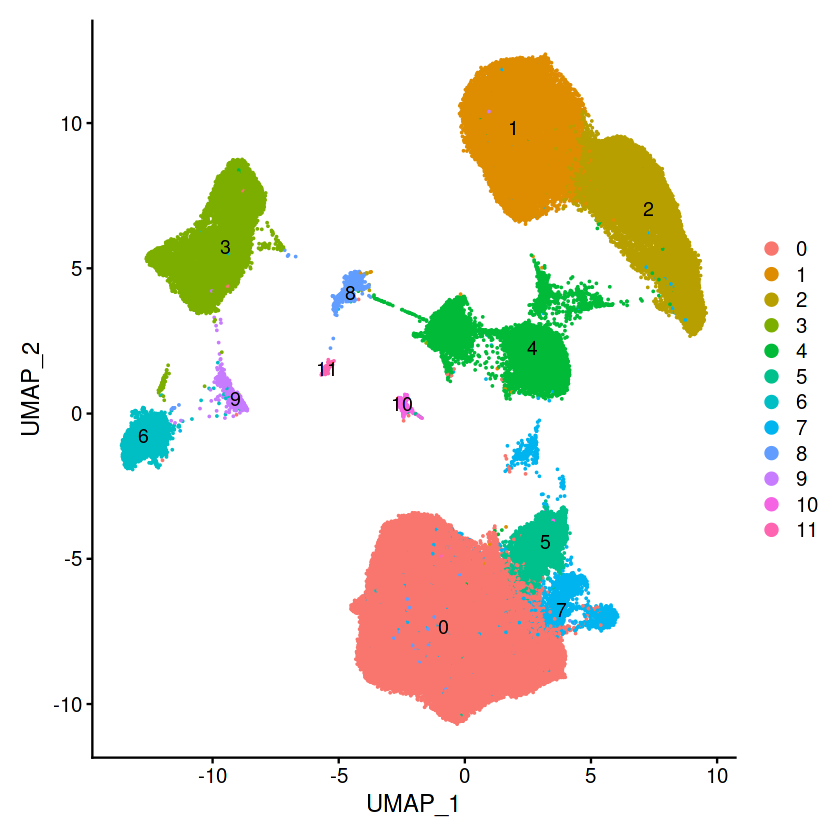

In [5]:
DimPlot(syno, raster=FALSE, label=TRUE)

# Fix Metadata

In [6]:
syno$Donor<- plyr::revalue(as.character(syno$Unique_ID),
                                c(
                                "NaiveSA131" = 'SA131',
                                  "NaiveSA138" = 'SA138',
                                  "NaiveSA146" = 'SA146',
                                  "NaiveSA172" = 'SA172',
                                  "SA271_SYN" = 'SA271',
                                  "SA271_Blood_new" = 'SA271',
                                  "SA276_SYN" = 'SA276',
                                  "SA276_Blood" = 'SA276',
                                  "ResistantSA144" = 'SA144',
                                 "ResistantSA145" = 'SA145',
                                  "ResistantSA151" = 'SA151',
                                  "ResistantSA166" = 'SA166',
                                 "SA272_SYN" = 'SA272',
                                  "SA272_Blood" = 'SA272',
                                 "RemSA132" = 'SA132',
                                 "RemSA160" = 'SA160',
                                 "RemSA161" = 'SA161',
                                 "RemSA174" = 'SA174'))

In [7]:
syno$group <- plyr::revalue(as.character(syno$Donor),
                                c("HC0547" = 'Healthy',
                                  "HC0572" = 'Healthy',
                                  "HC0701" = 'Healthy',
                                  "HC0732" = 'Healthy',
                                  "PBMC_10X"= 'Healthy',
                                  "A5_HTO5"='Healthy',
                                  "A2_HTO2"='Healthy',
                                  "A7_HTO5"='Healthy',
                                "SA131" = 'Naive RA',
                                  "SA138" = 'Naive RA',
                                  "SA146" = 'Naive RA',
                                  "SA172" = 'Naive RA',
                                  "SA139" = 'Naive RA',
                                  "SA220" = 'Naive RA',
                                  "SA271" = 'Naive RA',
                                  "SA276" = 'Naive RA',
                                  "SA144" = 'Resistant to cDMARDs RA',
                                 "SA145" = 'Resistant to cDMARDs RA',
                                  "SA151" = 'Resistant to cDMARDs RA',
                                  "SA166" = 'Resistant to cDMARDs RA',
                                 "SA222" = 'Resistant to cDMARDs RA',
                                 "SA227" = 'Resistant to cDMARDs RA',
                                 "SA272" = 'Resistant to cDMARDs RA',
                                  "A1" = 'Resistant to bDMARDs RA',
                                  "A3" = 'Resistant to bDMARDs RA',
                                  "A5_HTO3"='Difficult to treat RA',
                                  "A7_HTO4"='Difficult to treat RA',
                                  "A8"='Difficult to treat RA',
                                 "SA132" = 'Remission RA',
                                 "SA160" = 'Remission RA',
                                 "SA161" = 'Remission RA',
                                 "SA174" = 'Remission RA',
                                 "SA159" = 'Remission RA',
                                 "SA168" = 'Remission RA',
                                 "SA225" = 'Remission RA',
                                 "A10-RNA" = 'Remission RA',
                                 "A9-RNA" = 'Remission RA'))

In [8]:
syno$group <- as.ordered(factor(syno$group, levels=c("Healthy","Naive RA","Resistant to cDMARDs RA",
                                                     "Resistant to bDMARDs RA","Difficult to treat RA",
                                                    "Remission RA")))

In [9]:
table(syno$group)


                Healthy                Naive RA Resistant to cDMARDs RA 
                  22432                   57668                   35595 
Resistant to bDMARDs RA   Difficult to treat RA            Remission RA 
                   1899                    7543                   19187 

In [10]:
syno$condition <- plyr::revalue(as.character(syno$group),
                                c('Naive RA'='Active RA',
                                 'Resistant to cDMARDs RA'='Active RA',
                                 'Resistant to bDMARDs RA'='Active RA',
                                 'Difficult to treat RA'='Active RA'))

In [11]:
syno$condition <- as.ordered(factor(syno$condition, levels=c("Healthy","Active RA",
                                                    "Remission RA")))

In [12]:
unique(syno$Donor)

[1] "HC0547"   "HC0572"   "HC0732"   "SA138"    "SA146"    "SA172"   
 [7] "SA132"    "SA160"    "SA161"    "SA174"    "SA144"    "SA151"   
[13] "SA166"    "HC0701"   "SA131"    "SA145"    "SA139"    "SA159"   
[19] "SA168"    "SA220"    "SA222"    "SA225"    "SA227"    "SA272"   
[25] "SA271"    "SA276"    "PBMC_10X" "A1"       "A10-RNA"  "A2_HTO2" 
[31] "A5_HTO5"  "A5_HTO3"  "A7_HTO5"  "A7_HTO4"  "A8"       "A9-RNA"  
[37] "A3"

In [13]:
unique(syno@meta.data$Experiment)

[1] "Oxford"      "Glasgow1"    "Glasgow2_ST" "Glasgow2_PB" "10X"        
[6] "Glasgow3"

In [14]:
syno$Experiment <- plyr::revalue(syno$Experiment, c("Glasgow2_PB"='Glasgow2',"Glasgow2_ST"='Glasgow2'))

In [15]:
unique(syno@meta.data$Experiment)

[1] "Oxford"   "Glasgow1" "Glasgow2" "10X"      "Glasgow3"

In [16]:
syno$Platform <- "10x Genomics"

In [17]:
syno$lowDoublets <- syno$'Doublets Low Confidence'
syno$highDoublets <- syno$'Doublets High Confidence'

# Load the peripheral blood baseline cells enriched for HLADRpos from BDRhapsody

In [18]:
rhapsody <- readRDS("/datastore/MKS_Data/UNpublished/DC_paper_Immunity/temp_organoid_PB.rds")

In [19]:
rhapsody

An object of class Seurat 
29200 features across 14765 samples within 1 assay 
Active assay: RNA (29200 features, 2000 variable features)
 3 dimensional reductions calculated: pca, harmony, umap

In [20]:
unique(rhapsody@meta.data$Tissue)

[1] "Organoid" "PB"

In [21]:
rhapsody$Donor <- rhapsody$Unique_ID

In [22]:
rhapsody$Platform <- rhapsody$platform

In [23]:
#Keep only baseline blood
rhapsody <- subset(rhapsody, subset = Tissue == "PB")

In [24]:
rhapsody$group <- "Healthy"
rhapsody$condition <- "Healthy"
rhapsody$Tissue <- "PB"
rhapsody$Experiment <- "Rhapsody.PB"
rhapsody$Platform <- "BD.rhapsody"

# Add new healthy whole synovium data

In [125]:
healthy.10x <- readRDS("/datastore/Dom/Saved/Healthy_nointrons_2024-12-10_Seurat.merged.rds")

In [126]:
healthy.10x

An object of class Seurat 
36601 features across 21985 samples within 1 assay 
Active assay: RNA (36601 features, 2000 variable features)
 2 dimensional reductions calculated: pca, umap

In [127]:
healthy.10x$Donor <- healthy.10x$orig.ident
healthy.10x$group <- "Healthy"
healthy.10x$condition <- "Healthy"
healthy.10x$Tissue <- "ST"
healthy.10x$Platform <- "10x Genomics"
healthy.10x$Experiment <- "Glasgow4"
healthy.10x$lowDoublets <- healthy.10x$`Doublets Low stringency`
healthy.10x$highDoublets <- healthy.10x$`Doublets High stringency`

In [131]:
healthy.10x$cellID <- colnames(healthy.10x)

In [133]:
#Remove barcode 
healthy.10x$cellID <- sub(".*-", "", healthy.10x$cellID)

In [135]:
table(healthy.10x$cellID, healthy.10x$orig.ident)

     
      H1-RNA H2-RNA H34-RNA
  1_3   2798      0       0
  1_4      0  18726       0
  1_5      0      0     461

In [134]:
head(healthy.10x@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.hb,percent.ribo,percent.MALAT1,RNA_snn_res.0.1,seurat_clusters,Doublets Low stringency,Doublets High stringency,Donor,group,condition,Tissue,Platform,Experiment,lowDoublets,highDoublets,cellID
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
AAACCCAGTTGTGGAG-1_3,H1-RNA,3494.925,1658,2.840797,0.022939136,9.470595,6.5638138,2,2,Singlet,Doublet,H1-RNA,Healthy,Healthy,ST,10x Genomics,Glasgow4,Singlet,Doublet,1_3
AAACGAAGTACTAACC-1_3,H1-RNA,6803.235,2461,2.904771,0.131981525,15.199790,6.0112166,0,0,Singlet,Doublet,H1-RNA,Healthy,Healthy,ST,10x Genomics,Glasgow4,Singlet,Doublet,1_3
AAACGAAGTAGCGAGT-1_3,H1-RNA,2603.401,961,5.608000,0.000000000,39.257683,1.8469929,8,8,Singlet,Doublet,H1-RNA,Healthy,Healthy,ST,10x Genomics,Glasgow4,Singlet,Doublet,1_3
AAACGAAGTGCAGTGA-1_3,H1-RNA,8221.651,2445,1.150648,0.006482305,23.936564,0.2539267,2,2,Singlet,Doublet,H1-RNA,Healthy,Healthy,ST,10x Genomics,Glasgow4,Singlet,Doublet,1_3
AAACGAAGTGTTCATG-1_3,H1-RNA,8441.313,2667,3.522950,0.009833238,17.803405,7.2942357,2,2,Singlet,Doublet,H1-RNA,Healthy,Healthy,ST,10x Genomics,Glasgow4,Singlet,Doublet,1_3
AAACGAATCGTCGGGT-1_3,H1-RNA,2312.118,877,2.301769,0.000000000,35.784541,1.8725714,1,1,Singlet,Doublet,H1-RNA,Healthy,Healthy,ST,10x Genomics,Glasgow4,Singlet,Doublet,1_3


In [1]:
healthy.rhapsody <- readRDS("/datastore/Dom/Saved/BD_without_introns_Healthy_QC_2_HC-SYN-Index-3_Seurat.rds")

In [2]:
healthy.rhapsody

Loading required package: SeuratObject

Loading required package: sp

The legacy packages maptools, rgdal, and rgeos, underpinning the sp package,
which was just loaded, will retire in October 2023.
Please refer to R-spatial evolution reports for details, especially
https://r-spatial.org/r/2023/05/15/evolution4.html.
It may be desirable to make the sf package available;
package maintainers should consider adding sf to Suggests:.
The sp package is now running under evolution status 2
     (status 2 uses the sf package in place of rgdal)



An object of class Seurat 
27897 features across 47387 samples within 1 assay 
Active assay: RNA (27897 features, 0 variable features)

In [6]:
head(healthy.rhapsody@meta.data)

,orig.ident,nCount_RNA,nFeature_RNA,Cell_Type_Experimental,Sample_Tag,Sample_Name,percent.mt,percent.hb,percent.ribo,percent.MALAT1,RNA_snn_res.0.1,seurat_clusters,Doublets Low stringency,Doublets High stringency
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
8,HSM_4029,1760,793,Monocyte_classical,SampleTag07_hs,HSM_4029,20.34091,0.1136364,9.090909,0.00000000,1,1,Doublet,Singlet
13,HSM_4029,663,400,B,SampleTag07_hs,HSM_4029,12.97134,0.0000000,14.328808,0.15082956,2,2,Singlet,Doublet
30,HSM_4029,2201,1008,Monocyte_classical,SampleTag07_hs,HSM_4029,15.44752,0.0000000,10.676965,0.04543389,5,5,Doublet,Singlet
49,HSM_4029,595,331,Monocyte_classical,SampleTag07_hs,HSM_4029,29.91597,0.0000000,9.243697,1.00840336,2,2,Singlet,Doublet
88,HSM_4029,563,289,Monocyte_classical,SampleTag07_hs,HSM_4029,28.41918,0.0000000,9.946714,1.06571936,4,4,Singlet,Doublet
387,HSM_4029,761,428,Monocyte_classical,SampleTag07_hs,HSM_4029,15.50591,0.0000000,7.227332,0.13140604,3,3,Singlet,Doublet


In [30]:
healthy.rhapsody$Donor <- healthy.rhapsody$Sample_Name

In [31]:
healthy.rhapsody$group <- "Healthy"
healthy.rhapsody$condition <- "Healthy"
healthy.rhapsody$Tissue <- "ST"
healthy.rhapsody$Platform <- "BD.rhapsody"
healthy.rhapsody$Experiment <- "Rhapsody.HealthyST"

In [32]:
healthy.rhapsody$lowDoublets <- healthy.rhapsody$`Doublets Low stringency`
healthy.rhapsody$highDoublets <- healthy.rhapsody$`Doublets High stringency`

# Add BM transplant data

In [2]:
bm.transplant <- readRDS("/data/lucy/rhapsody/BMTransplant/bmt003.st.rds")

In [3]:
bm.transplant

An object of class Seurat 
19750 features across 5186 samples within 1 assay 
Active assay: RNA (19750 features, 2000 variable features)
 3 dimensional reductions calculated: harmony, umap, pca

In [4]:
bm.transplant$Donor <- bm.transplant$patient
bm.transplant$group <- "Arthralgia"
bm.transplant$condition <- "Arthralgia"
bm.transplant$Tissue <- "ST"
bm.transplant$Platform <- "BD.rhapsody"
bm.transplant$Experiment <- "Rhapsody.BMTransplant"

In [5]:
head(bm.transplant)

,orig.ident,nCount_RNA,nFeature_RNA,sample,patient,gender,population,origin,cartridge,transplant,⋯,seurat_clusters,RNA_snn_res.0.4,clusters,snps.ident,Donor,group,condition,Tissue,Platform,Experiment
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,⋯,<fct>,<fct>,<ord>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>
730678_7,SeuratProject,32562,5160,BM003_HET_ST_FLS,BM003_HET,Male,FLS,ST,1,heterologous,⋯,5,5,Lining FLS,Recipient,BM003_HET,Arthralgia,Arthralgia,ST,BD.rhapsody,Rhapsody.BMTransplant
720836_7,SeuratProject,26378,4542,BM003_HET_ST_FLS,BM003_HET,Male,FLS,ST,1,heterologous,⋯,5,5,Lining FLS,Recipient,BM003_HET,Arthralgia,Arthralgia,ST,BD.rhapsody,Rhapsody.BMTransplant
512456_7,SeuratProject,24606,4423,BM003_HET_ST_FLS,BM003_HET,Male,FLS,ST,1,heterologous,⋯,5,5,Lining FLS,Recipient,BM003_HET,Arthralgia,Arthralgia,ST,BD.rhapsody,Rhapsody.BMTransplant
781355_7,SeuratProject,23720,4655,BM003_HET_ST_FLS,BM003_HET,Male,FLS,ST,1,heterologous,⋯,5,5,Lining FLS,Recipient,BM003_HET,Arthralgia,Arthralgia,ST,BD.rhapsody,Rhapsody.BMTransplant
777033_7,SeuratProject,24220,4302,BM003_HET_ST_FLS,BM003_HET,Male,FLS,ST,1,heterologous,⋯,5,5,Lining FLS,Recipient,BM003_HET,Arthralgia,Arthralgia,ST,BD.rhapsody,Rhapsody.BMTransplant
35246_7,SeuratProject,26234,4619,BM003_HET_ST_FLS,BM003_HET,Male,FLS,ST,1,heterologous,⋯,5,5,Lining FLS,Recipient,BM003_HET,Arthralgia,Arthralgia,ST,BD.rhapsody,Rhapsody.BMTransplant
154026_7,SeuratProject,23054,4499,BM003_HET_ST_FLS,BM003_HET,Male,FLS,ST,1,heterologous,⋯,5,5,Lining FLS,Recipient,BM003_HET,Arthralgia,Arthralgia,ST,BD.rhapsody,Rhapsody.BMTransplant
638935_7,SeuratProject,22687,4134,BM003_HET_ST_FLS,BM003_HET,Male,FLS,ST,1,heterologous,⋯,5,5,Lining FLS,Recipient,BM003_HET,Arthralgia,Arthralgia,ST,BD.rhapsody,Rhapsody.BMTransplant
555939_7,SeuratProject,21469,4421,BM003_HET_ST_FLS,BM003_HET,Male,FLS,ST,1,heterologous,⋯,5,5,Lining FLS,Recipient,BM003_HET,Arthralgia,Arthralgia,ST,BD.rhapsody,Rhapsody.BMTransplant


# Add GSK whole synovium data

In [36]:
gsk.syno <- readRDS("Jan25_GSK_for_TREM2_paper.rds")

In [37]:
gsk.syno$Donor <- gsk.syno$Patient
gsk.syno$Tissue <- "ST"
gsk.syno$Platform <- "10x Genomics"
gsk.syno$Experiment <- "GSK.WholeST"

In [38]:
table(gsk.syno$Donor, gsk.syno$Condition)

       
        Active D2T Active in cDMARDs Naive Remission
  SA457          0                 0     0      1251
  SA458          0                 0     0      1844
  SA492          0                 0     0       329
  SA541          0                 0     0       250
  SA563          0                 0     0      1326
  SA565          0                 0     0       961
  SA572          0                 0     0      2832
  SA600       6272                 0     0         0
  SA612          0                 0  3752         0
  SA614          0               211     0         0
  SA619          0                 0     0      1487
  SA636          0                 0 17732         0
  SA658          0                 0     0       681

In [39]:
gsk.syno$group <- gsk.syno$Condition

In [40]:
gsk.syno$group <- plyr::revalue(as.character(gsk.syno$group),
                                c('Naive'='Naive RA',
                                 'Active in cDMARDs'='Resistant to cDMARDs RA',
                                  'Active D2T'='Difficult to treat RA',
                                 'Remission'='Remission RA'))

In [41]:
gsk.syno$condition <- plyr::revalue(as.character(gsk.syno$group),
                                c('Naive RA'='Active RA',
                                 'Resistant to cDMARDs RA'='Active RA',
                                 'Difficult to treat RA'='Active RA'))

In [42]:
gsk.syno

An object of class Seurat 
36601 features across 38928 samples within 1 assay 
Active assay: RNA (36601 features, 0 variable features)

# Merge all peripheral blood and synovium data

In [43]:
syno <- UpdateSeuratObject(syno)
rhapsody <- UpdateSeuratObject(rhapsody)
healthy.rhapsody <- UpdateSeuratObject(healthy.rhapsody)
bm.transplant <- UpdateSeuratObject(bm.transplant)

Validating object structure

Updating object slots

Ensuring keys are in the proper structure

Ensuring feature names don't have underscores or pipes

Object representation is consistent with the most current Seurat version

Validating object structure

Updating object slots

Ensuring keys are in the proper structure

Ensuring feature names don't have underscores or pipes

Object representation is consistent with the most current Seurat version

Validating object structure

Updating object slots

Ensuring keys are in the proper structure

Ensuring feature names don't have underscores or pipes

Object representation is consistent with the most current Seurat version

Validating object structure

Updating object slots

Ensuring keys are in the proper structure

Ensuring feature names don't have underscores or pipes

Object representation is consistent with the most current Seurat version



In [44]:
#Recreate seurat object to prevent error
healthy.10x <- CreateSeuratObject(counts = healthy.10x@assays$RNA@counts, metadata = healthy.10x@meta.data)

In [45]:
healthy.10x <- UpdateSeuratObject(healthy.10x)

Validating object structure

Updating object slots

Ensuring keys are in the proper structure

Ensuring feature names don't have underscores or pipes

Object representation is consistent with the most current Seurat version



In [47]:
healthy.10x$group <- "Healthy"
healthy.10x$condition <- "Healthy"
healthy.10x$Tissue <- "ST"
healthy.10x$Platform <- "10x Genomics"
healthy.10x$Experiment <- "Glasgow4"

In [48]:
head(healthy.10x)

,orig.ident,nCount_RNA,nFeature_RNA,Donor,group,condition,Tissue,Platform,Experiment
,<fct>,<dbl>,<int>,<fct>,<chr>,<chr>,<chr>,<chr>,<chr>
AAACCCAGTTGTGGAG-1_3,SeuratProject,3494.925,1658,SeuratProject,Healthy,Healthy,ST,10x Genomics,Glasgow4
AAACGAAGTACTAACC-1_3,SeuratProject,6803.235,2461,SeuratProject,Healthy,Healthy,ST,10x Genomics,Glasgow4
AAACGAAGTAGCGAGT-1_3,SeuratProject,2603.401,961,SeuratProject,Healthy,Healthy,ST,10x Genomics,Glasgow4
AAACGAAGTGCAGTGA-1_3,SeuratProject,8221.651,2445,SeuratProject,Healthy,Healthy,ST,10x Genomics,Glasgow4
AAACGAAGTGTTCATG-1_3,SeuratProject,8441.313,2667,SeuratProject,Healthy,Healthy,ST,10x Genomics,Glasgow4
AAACGAATCGTCGGGT-1_3,SeuratProject,2312.118,877,SeuratProject,Healthy,Healthy,ST,10x Genomics,Glasgow4
AAACGAATCTGTCCCA-1_3,SeuratProject,6370.380,2251,SeuratProject,Healthy,Healthy,ST,10x Genomics,Glasgow4
AAACGCTCACAAGTGG-1_3,SeuratProject,2228.263,985,SeuratProject,Healthy,Healthy,ST,10x Genomics,Glasgow4
AAACGCTGTACGTACT-1_3,SeuratProject,5376.127,2166,SeuratProject,Healthy,Healthy,ST,10x Genomics,Glasgow4


In [49]:
common.features <- Reduce(intersect, list(rownames(syno),rownames(rhapsody),rownames(healthy.10x),
                                          rownames(healthy.rhapsody),rownames(bm.transplant), rownames(gsk.syno)))
length(x = common.features)

[1] 16025

In [50]:
# Merge based on common features only
syno <- merge(x=syno[common.features, ], y=c(rhapsody[common.features, ],
                                            healthy.10x[common.features, ],
                                            healthy.rhapsody[common.features, ],
                                            bm.transplant[common.features, ],
                                            gsk.syno[common.features, ]))

In [51]:
syno

An object of class Seurat 
16025 features across 269148 samples within 1 assay 
Active assay: RNA (16025 features, 0 variable features)

In [52]:
#Continue with typical preprocessing pipeline
syno <- syno %>%
    NormalizeData() %>%
    FindVariableFeatures(selection.method = "vst", nfeatures = 2000) %>% 
    ScaleData() %>% RunPCA()

Centering and scaling data matrix

PC_ 1 
Positive:  CTSS, LYZ, HLA-DRA, HLA-DPA1, CYBB, CD74, MS4A6A, HLA-DRB1, LST1, HLA-DPB1 
	   COTL1, HLA-DQB1, MS4A7, S100A9, PLEK, CD14, CPVL, HLA-DMB, CLEC7A, SPI1 
	   MNDA, HLA-DQA1, HLA-DMA, S100A8, FCGR2A, C5AR1, NCF2, MPEG1, CXCR4, CSF1R 
Negative:  MGP, COL1A2, PLAC9, LUM, DCN, TIMP3, PLA2G2A, CCDC80, COL6A2, C1R 
	   PRG4, C1S, PCOLCE, CLU, FSTL1, CALD1, COL6A1, COL3A1, SPARCL1, TNXB 
	   NNMT, ABI3BP, CAV1, IGFBP6, EFEMP1, SPARC, ISLR, HTRA1, IGFBP4, GSN 
PC_ 2 
Positive:  CST3, CTSB, CD68, FTL, CD14, CTSZ, MS4A6A, CFD, S100A6, C1QA 
	   CTSL, C1QB, CYBB, CD163, HLA-DRA, C1QC, MS4A7, MAFB, GLUL, LYZ 
	   GPNMB, HLA-DRB1, TGFBI, VSIG4, FTH1, CTSD, LGMN, RNASE1, MARCO, CTSS 
Negative:  IL32, CD3D, TRBC2, CD2, LTB, CD3E, CD3G, TRAC, IL7R, GZMA 
	   CCL5, GZMM, LCK, CD7, CD247, TRBC1, NKG7, CST7, SPOCK2, SYNE2 
	   ISG20, BCL11B, CTSW, GIMAP7, KLRB1, IKZF3, CD69, SAMD3, LINC00861, HOPX 
PC_ 3 
Positive:  VCAN, RIPOR2, SEMA3C, MGST1, LUM, ABI

In [53]:
saveRDS(syno, "all.pb.syno_withDoublets.rds")

In [54]:
rm(list=ls())
gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,7654161,408.8,14141884,755.3,14141884,755.3
Vcells,1101699601,8405.4,5005523116,38189.2,6233585155,47558.5


# Integration with harmony

In [55]:
syno <- readRDS("all.pb.syno_withDoublets.rds")

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony 6/10

Harmony 7/10

Harmony converged after 7 iterations

13:58:28 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

13:58:29 Read 269148 rows and found 40 numeric columns

13:58:29 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

13:58:29 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

13:59:17 Writing NN index file to temp file /datastore/lucy/tmp//file344837259c8f63

13:59:17 Searching Annoy index using 1 thread, search_k = 3000

14:02:29 Annoy recall = 100%

14:0

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 269148
Number of edges: 8397533

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9129
Number of communities: 43
Elapsed time: 484 seconds


3 singletons identified. 40 final clusters.



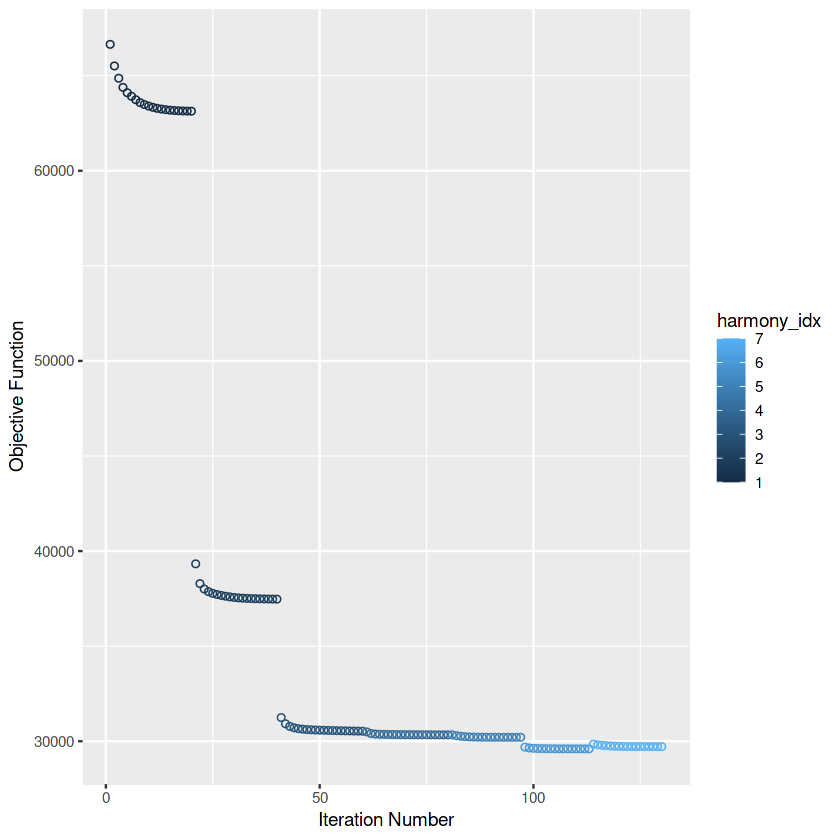

In [56]:
syno <- syno %>% 
    RunHarmony(group.by.vars=c("Donor","Experiment","Tissue", "Platform"), plot_convergence = TRUE, theta=c(0,1,0,0))
#Run UMAP and clustering 
syno <- RunUMAP(object = syno, reduction = "harmony", dims = 1:40)
syno <- FindNeighbors(object = syno, reduction = "harmony", dims = 1:40)
syno <- FindClusters(syno, res=1.0)

In [57]:
syno <- FindClusters(syno, res=2)

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 269148
Number of edges: 8397533

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8750
Number of communities: 64
Elapsed time: 545 seconds


3 singletons identified. 61 final clusters.



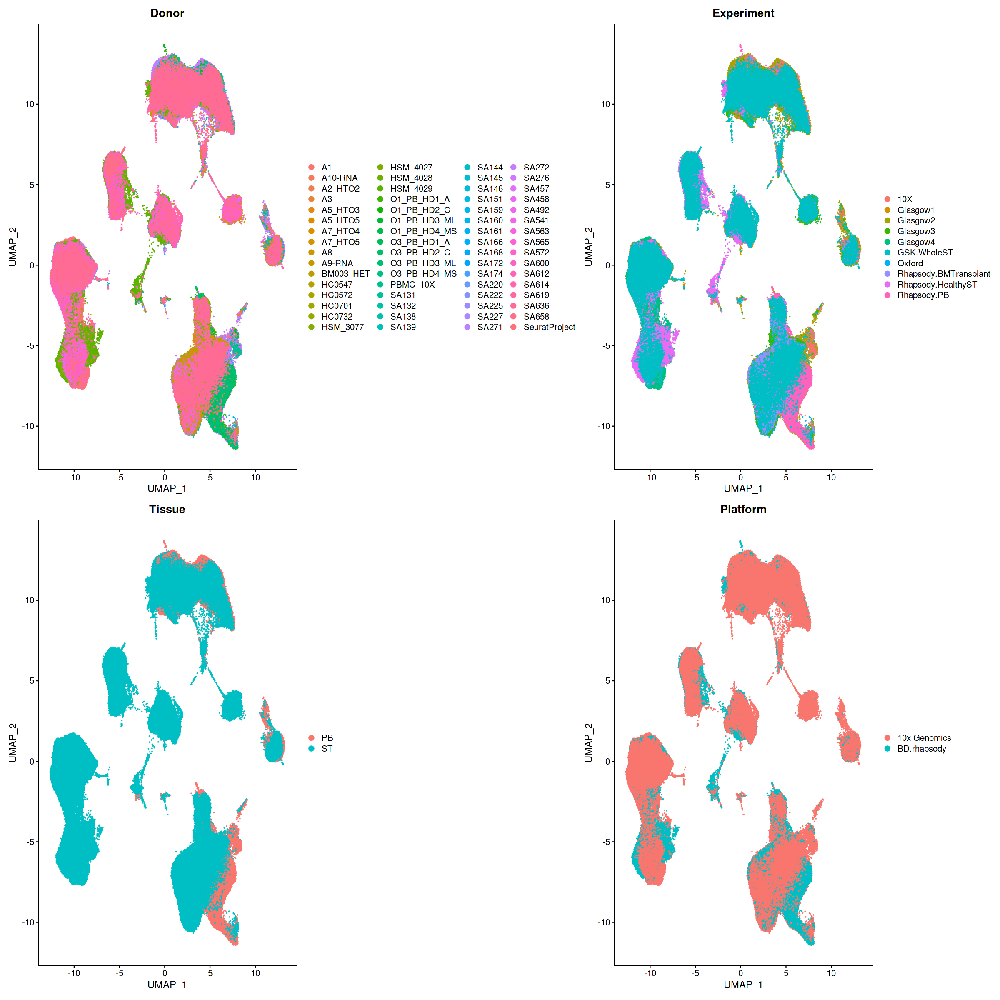

In [58]:
options(repr.plot.width=20, repr.plot.height=20)
DimPlot(syno, group.by=c("Donor","Experiment","Tissue", "Platform"), raster=FALSE)

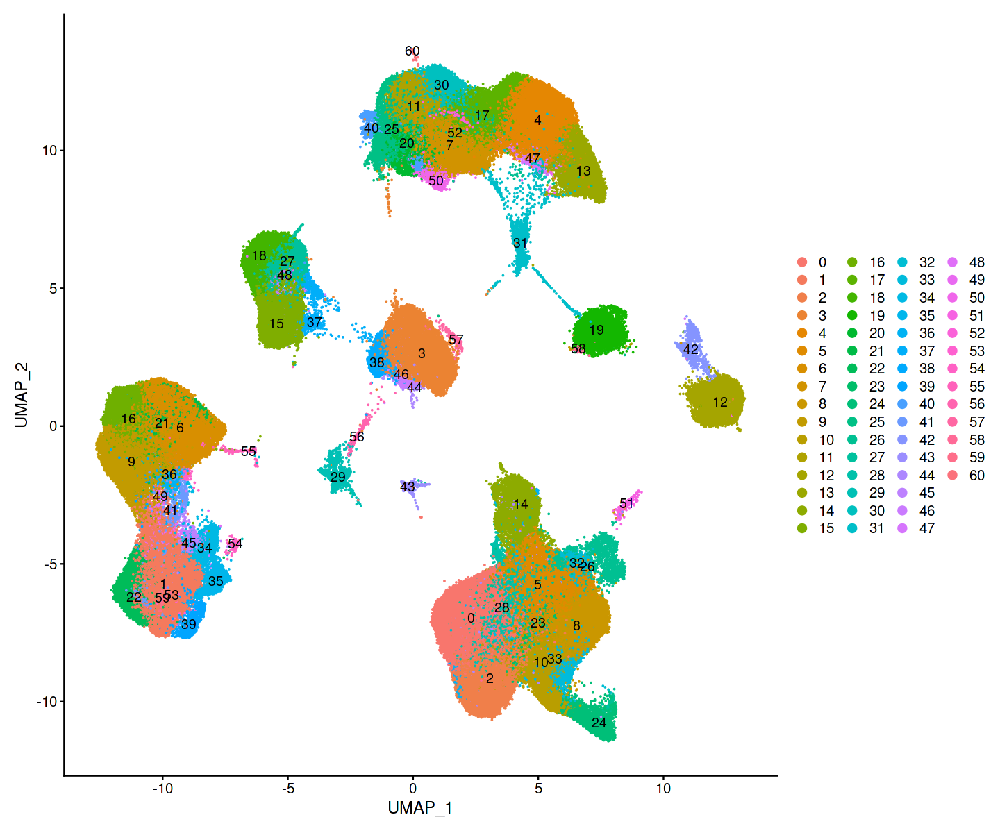

In [59]:
options(repr.plot.width=12, repr.plot.height=10)
DimPlot(syno, raster=FALSE, label=TRUE)

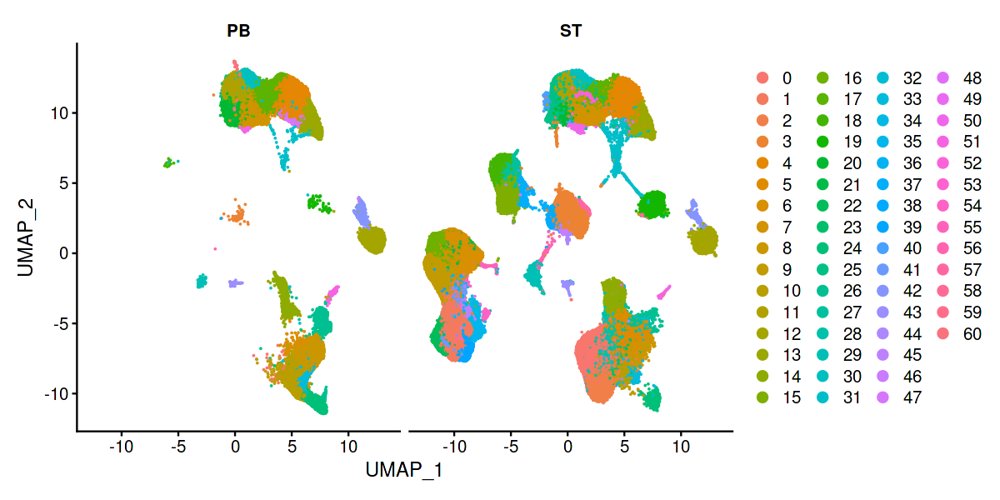

In [60]:
options(repr.plot.width=10, repr.plot.height=5)
DimPlot(syno, raster=FALSE, split.by="Tissue")

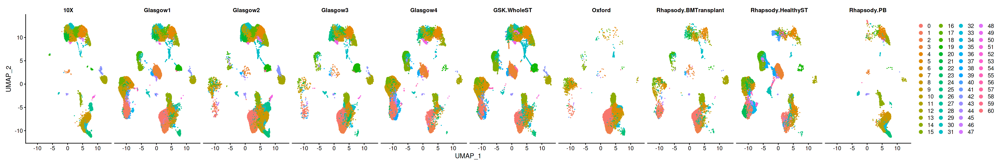

In [61]:
options(repr.plot.width=30, repr.plot.height=5)
DimPlot(syno, raster=FALSE, split.by="Experiment")

# Identify and remove doublets

In [62]:
unique(colnames(syno@meta.data))

[1] "orig.ident"               "nCount_RNA"              
  [3] "nFeature_RNA"             "percent.mt"              
  [5] "percent.hb"               "percent.ribo"            
  [7] "RNA_snn_res.0.1"          "seurat_clusters"         
  [9] "pANN_0.25_0.09_3"         "Doublets Low Confidence" 
 [11] "Doublets High Confidence" "pANN_0.25_0.24_11"       
 [13] "pANN_0.25_0.12_2"         "pANN_0.25_0.01_13"       
 [15] "pANN_0.25_0.01_9"         "pANN_0.25_0.25_13"       
 [17] "pANN_0.25_0.03_9"         "pANN_0.25_0.04_2"        
 [19] "pANN_0.25_0.02_4"         "pANN_0.25_0.28_6"        
 [21] "pANN_0.25_0.09_10"        "pANN_0.25_0.26_6"        
 [23] "pANN_0.25_0.04_5"         "pANN_0.25_0.1_16"        
 [25] "pANN_0.25_0.09_1"         "pANN_0.25_0.03_2"        
 [27] "Experiment"               "Tissue"                  
 [29] "Unique_ID"                "Cont"                    
 [31] "pANN_0.25_0.23_447"       "pANN_0.25_0.01_39"       
 [33] "pANN_0.25_0.3_98"         "pANN_0.25_0.05_13"       
 [35] "pANN_0.25_0.005_101"      "pANN_0.25_0.05_15"       
 [37] "pANN_0.25_0.005_86"       "pANN_0.25_0.27_454"      
 [39] "pANN_0.25_0.3_52"         "pANN_0.25_0.09_662"      
 [41] "pANN_0.25_0.005_744"      "pANN_0.25_0.005_680"     
 [43] "pANN_0.25_0.26_674"       "pANN_0.25_0.12_500"      
 [45] "nCount_ADT"               "nFeature_ADT"            
 [47] "Name.exp"                 "Tagging"                 
 [49] "SampleID"                 "Condition"               
 [51] "Exp"                      "pANN_0.25_0.03_8"        
 [53] "pANN_0.25_0.27_27"        "HTO"                     
 [55] "HTO_status"               "pANN_0.25_0.27_1"        
 [57] "pANN_0.25_0.15_346"       "pANN_0.25_0.005_291"     
 [59] "SNP_cluster"              "SNP_status"              
 [61] "pANN_0.25_0.12_5"         "pANN_0.25_0.04_4"        
 [63] "pANN_0.25_0.14_20"        "pANN_0.25_0.21_39"       
 [65] "pANN_0.25_0.3_2"          "celltype"                
 [67] "Donor"                    "group"                   
 [69] "condition"                "Platform"                
 [71] "lowDoublets"              "highDoublets"            
 [73] "Cell_Type_Experimental"   "Sample_Tag"              
 [75] "Sample_Name"              "pANN_0.25_0.28_305"      
 [77] "pANN_0.25_0.22_29"        "pANN_0.25_0.09_135"      
 [79] "Origin"                   "platform"                
 [81] "percent.MALAT1"           "Doublets Low stringency" 
 [83] "Doublets High stringency" "sample"                  
 [85] "patient"                  "gender"                  
 [87] "population"               "origin"                  
 [89] "cartridge"                "transplant"              
 [91] "date"                     "RNA_snn_res.0.6"         
 [93] "RNA_snn_res.0.4"          "clusters"                
 [95] "snps.ident"               "Doublets.Low.stringency" 
 [97] "Doublets.High.stringency" "orig_snps"               
 [99] "orig_hto"                 "Library"                 
[101] "Unique_ID2"               "library_ID"              
[103] "Patient"                  "Biopsy_in"               
[105] "Fresh_or_frozen"          "Store"                   
[107] "Digested"                 "Sorted"                  
[109] "remission..maintained"    "RNA_snn_res.1"           
[111] "RNA_snn_res.2"

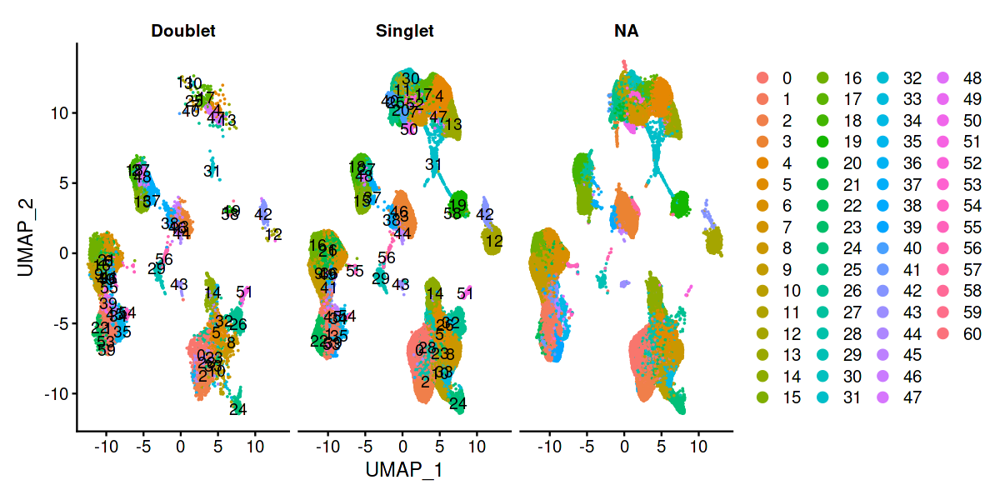

In [63]:
options(repr.plot.width=10, repr.plot.height=5)
DimPlot(syno, raster=FALSE, label=TRUE, split.by="lowDoublets")

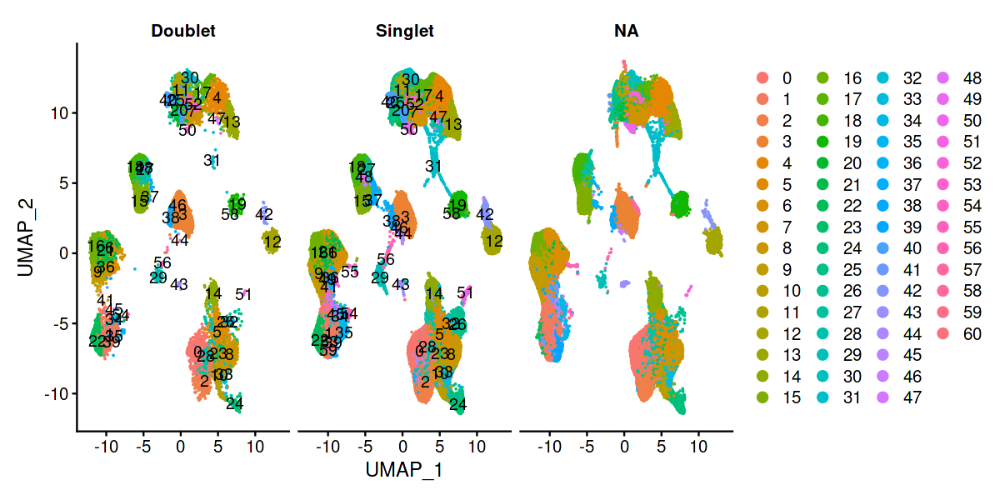

In [64]:
options(repr.plot.width=10, repr.plot.height=5)
DimPlot(syno, raster=FALSE, label=TRUE, split.by="highDoublets")

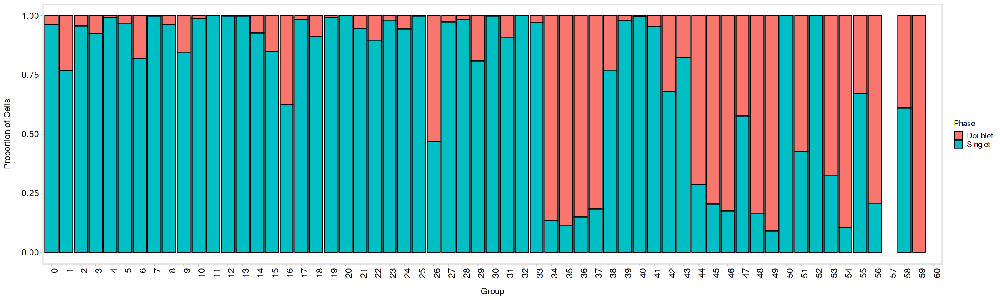

In [65]:
options(repr.plot.width=20, repr.plot.height=6)
freq_table_group <- as.data.frame(prop.table(x = table(syno$lowDoublets, syno$seurat_clusters), margin = 2))
ggplot(data=freq_table_group, aes(x=freq_table_group$Var2, y=freq_table_group$Freq, fill=freq_table_group$Var1)) + theme_powerpoint() +
  geom_bar(stat="identity", color="black") + labs(x="Group", y="Proportion of Cells", fill="Phase") + theme(strip.text = element_text(size = 15, face="bold"), strip.background = element_rect(), axis.text.x=element_text(angle=90, hjust=1)) 

In [66]:
#Identify which clusters have more than 25% doublets 
doublet.clusters <- freq_table_group[which(freq_table_group$Var1=="Doublet"&freq_table_group$Freq>=0.25),"Var2"]

In [67]:
##Remove any cluster more than 25% doublets 
syno <- subset(syno, idents=doublet.clusters, invert=TRUE)

In [68]:
syno

An object of class Seurat 
16025 features across 247678 samples within 1 assay 
Active assay: RNA (16025 features, 2000 variable features)
 3 dimensional reductions calculated: pca, harmony, umap

In [69]:
#Remove any remaining cells marked as doublets (~3K cells)
syno <- subset(syno, subset = lowDoublets == "Doublet", invert=TRUE)

In [70]:
#Remove any remaining cells marked as doublets (~3K cells)
syno <- subset(syno, subset = highDoublets == "Doublet", invert=TRUE)

In [71]:
syno

An object of class Seurat 
16025 features across 223647 samples within 1 assay 
Active assay: RNA (16025 features, 2000 variable features)
 3 dimensional reductions calculated: pca, harmony, umap

# Re-harmonize post doublet removal

In [72]:
#Continue with typical preprocessing pipeline
syno <- FindVariableFeatures(syno, selection.method = "vst", nfeatures = 2000)
syno <- ScaleData(syno, features = rownames(syno))
syno <- RunPCA(syno)
#Run UMAP before integration
syno <- RunUMAP(object = syno, reduction = "pca", dims = 1:40)

Centering and scaling data matrix

PC_ 1 
Positive:  CTSS, LYZ, HLA-DRA, CD74, HLA-DPA1, HLA-DRB1, MS4A6A, CYBB, HLA-DPB1, LST1 
	   HLA-DQB1, PLEK, MS4A7, S100A9, HLA-DMB, CPVL, CLEC7A, SPI1, MNDA, CD14 
	   HLA-DQA1, UCP2, C5AR1, S100A8, FCGR2A, NCF2, MPEG1, CSF1R, GPR183, IGSF6 
Negative:  PLAC9, MGP, COL1A2, LUM, CCDC80, DCN, COL6A2, TIMP3, C1R, PLA2G2A 
	   PRG4, PCOLCE, C1S, FSTL1, NNMT, TNXB, ABI3BP, CALD1, COL6A1, CLU 
	   IGFBP6, COL3A1, EFEMP1, CAV1, ISLR, HTRA1, SPARCL1, PCOLCE2, PPIC, NBL1 
PC_ 2 
Positive:  IL32, CD3D, TRBC2, CD2, LTB, CD3E, TRAC, CD3G, IL7R, CCL5 
	   GZMA, GZMM, LCK, CD7, TRBC1, SYNE2, CD247, CST7, NKG7, SPOCK2 
	   ISG20, BCL11B, CTSW, GIMAP7, KLRB1, CD69, IKZF3, TCF7, HOPX, CD27 
Negative:  CST3, CTSB, CD68, FTL, CD14, MS4A6A, CTSZ, HLA-DRA, CYBB, LYZ 
	   C1QA, MS4A7, C1QB, CD163, HLA-DRB1, MAFB, C1QC, GLUL, CFD, CTSS 
	   CTSL, TGFBI, FTH1, GPNMB, VSIG4, S100A6, RNASE1, HLA-DPA1, CD74, CTSD 
PC_ 3 
Positive:  SEMA3C, CRTAC1, ABI3BP, LUM, ITGBL1, THBS

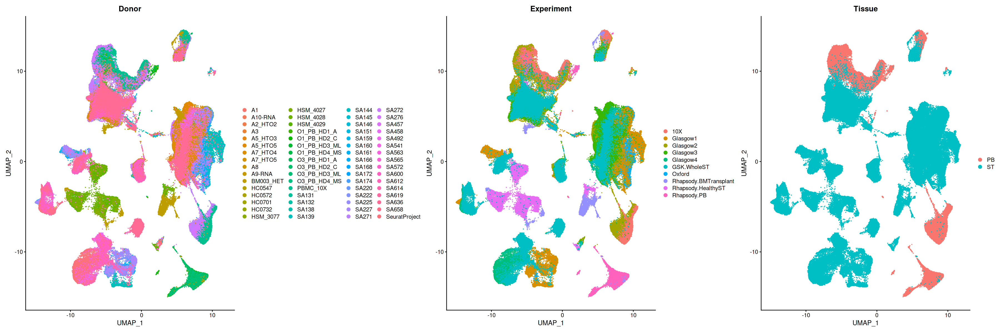

In [73]:
options(repr.plot.width=30, repr.plot.height=10)
DimPlot(syno, raster=FALSE, group.by=c("Donor","Experiment","Tissue"))

Harmony 1/10

Harmony 2/10

Harmony 3/10

Harmony 4/10

Harmony 5/10

Harmony converged after 5 iterations

15:54:42 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

15:54:42 Read 223647 rows and found 40 numeric columns

15:54:42 Using Annoy for neighbor search, n_neighbors = 30

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

15:54:42 Building Annoy index with metric = cosine, n_trees = 50

0%   10   20   30   40   50   60   70   80   90   100%

[----|----|----|----|----|----|----|----|----|----|

*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
*
|

15:55:21 Writing NN index file to temp file /datastore/lucy/tmp//file344837ab9cdf7

15:55:21 Searching Annoy index using 1 thread, search_k = 3000

15:57:41 Annoy recall = 100%

15:57:42 Commencing smooth kNN di

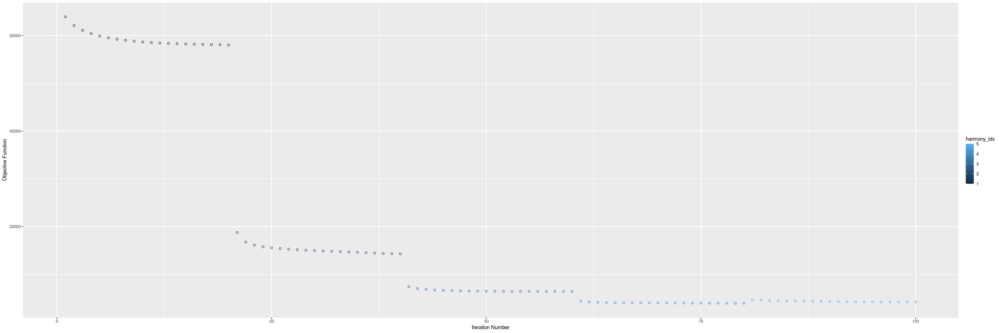

In [74]:
syno <- syno %>% 
    RunHarmony(group.by.vars=c("Donor","Experiment","Tissue","Platform"), plot_convergence = TRUE, theta=c(0,1,0,0))
#Run UMAP and clustering 
syno <- RunUMAP(object = syno, reduction = "harmony", dims = 1:40)

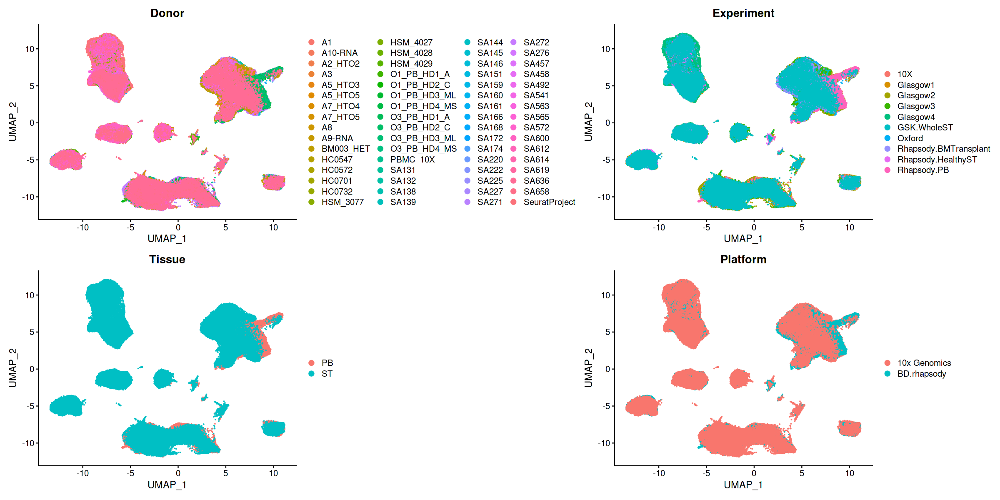

In [75]:
options(repr.plot.width=20, repr.plot.height=10)
DimPlot(syno, raster=FALSE, group.by=c("Donor","Experiment","Tissue", "Platform"))

In [76]:
syno <- FindNeighbors(object = syno, reduction = "harmony", dims = 1:40)
syno <- FindClusters(syno, res=0.5)

Computing nearest neighbor graph

Computing SNN



Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 223647
Number of edges: 7096121

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9388
Number of communities: 27
Elapsed time: 451 seconds


5 singletons identified. 22 final clusters.



In [77]:
table(syno$Donor,syno$group)

               
                Arthralgia Difficult to treat RA Healthy Naive RA Remission RA
  A1                     0                     0       0        0            0
  A10-RNA                0                     0       0        0         2191
  A2_HTO2                0                     0     419        0            0
  A3                     0                     0       0        0            0
  A5_HTO3                0                  4414       0        0            0
  A5_HTO5                0                     0    5195        0            0
  A7_HTO4                0                   663       0        0            0
  A7_HTO5                0                     0     688        0            0
  A8                     0                  1933       0        0            0
  A9-RNA                 0                     0       0        0         2717
  BM003_HET           5004                     0       0        0            0
  HC0547                 0          

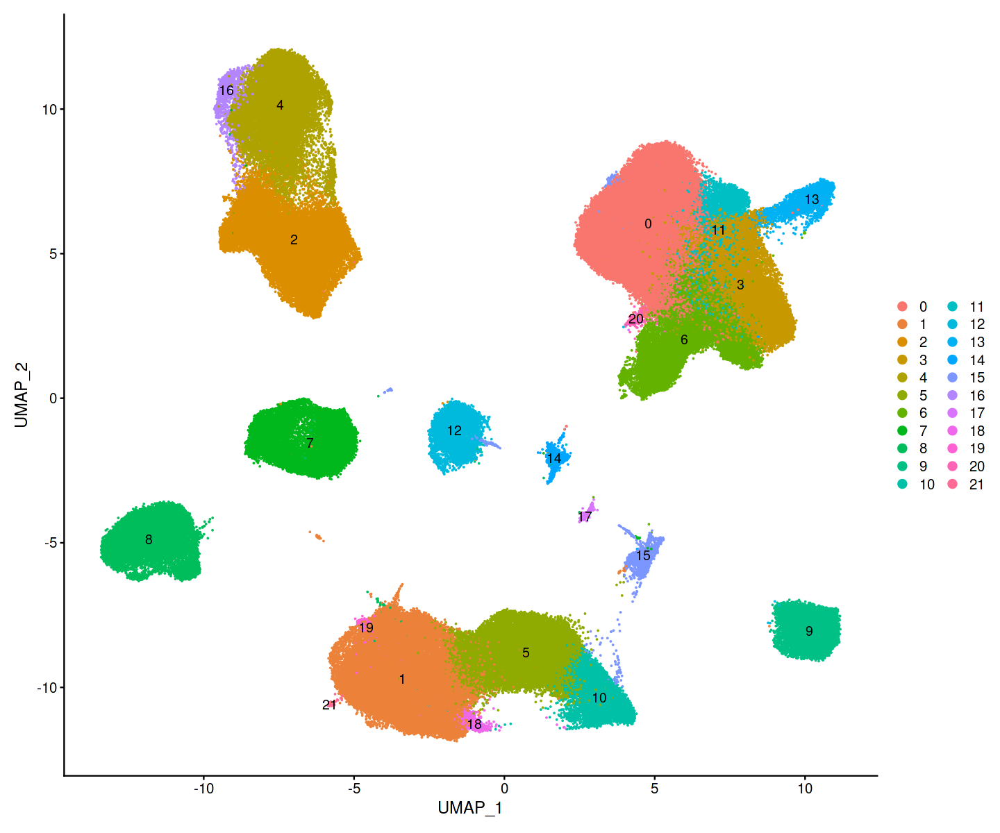

In [78]:
options(repr.plot.width=12, repr.plot.height=10)
DimPlot(syno, raster=FALSE, label=TRUE)

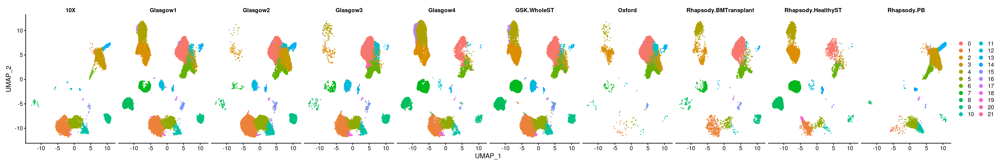

In [79]:
options(repr.plot.width=30, repr.plot.height=5)
DimPlot(syno, raster=FALSE, split.by=c("Experiment"))

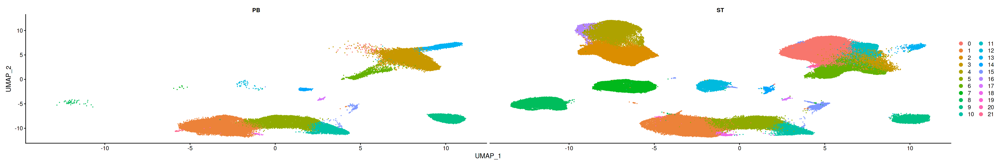

In [82]:
options(repr.plot.width=30, repr.plot.height=5)
DimPlot(syno, raster=FALSE, split.by=c("Tissue"))

In [80]:
saveRDS(syno, "all.pb.syno_doubletsRemoved.rds")

# Identify clusters

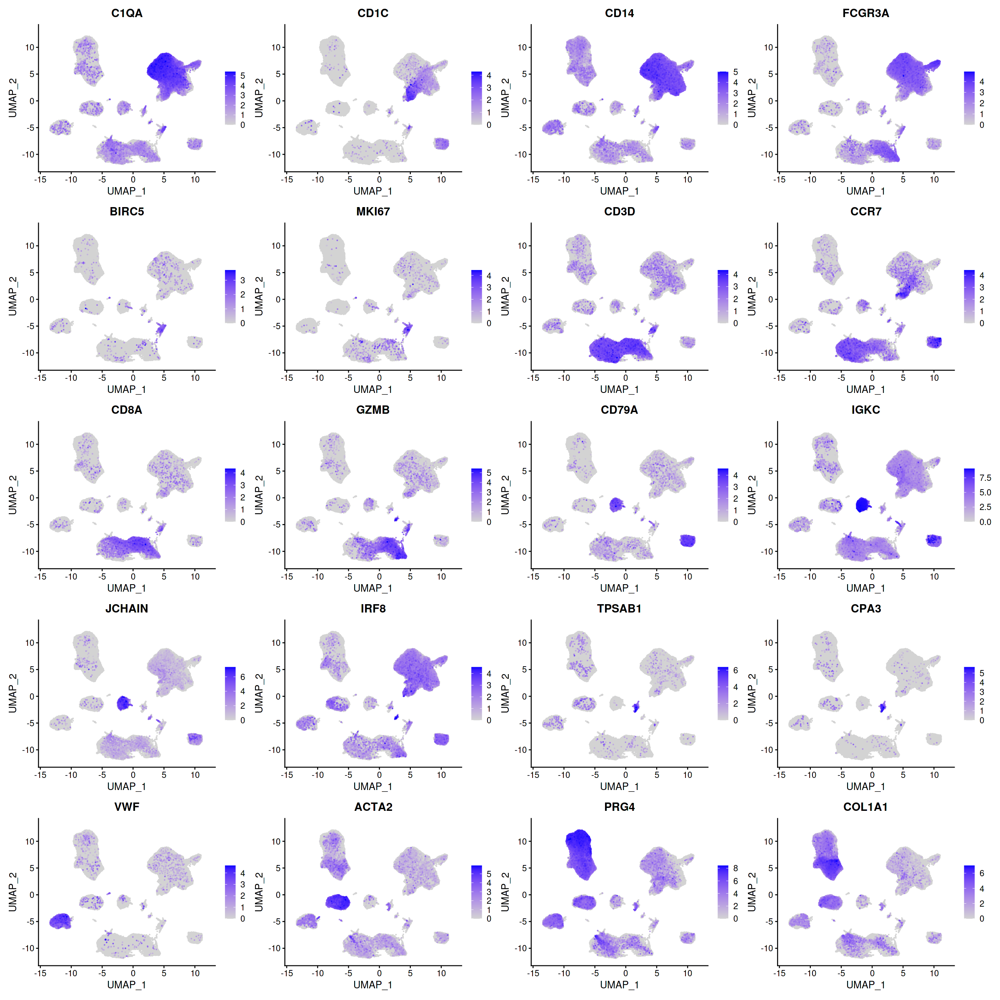

In [81]:
genes=c("C1QA","CD1C","CD14","FCGR3A","BIRC5","MKI67","CD3D","CCR7","CD8A","GZMB","CD79A","IGKC","JCHAIN","IRF8","TPSAB1","CPA3","PF4","PPBP","VWF","ACTA2","PRG4","COL1A1")
options(repr.plot.width=20, repr.plot.height=20)
FeaturePlot(syno, features = unique(genes),order=TRUE, raster=FALSE)

In [83]:
#Rename your clusters by celltype
Idents(syno) <- "seurat_clusters"
syno$celltype <- plyr::revalue(as.character(Idents(syno)),
                                        c("0" = 'Macrophage',"1" = 'CD4 T cells',"2" = 'Sublining FLS',
                                          "3" = 'CD14 Monocytes', "4" = 'Lining FLS',"5" = 'CD8 T cells',"6" = 'cDC',
                                          "7" = 'Pericytes',"8"='Endothelial cells',"9" = "B cells","10"='NK cells',"11" = 'Macrophage',"12" = 'Plasma cells',
                                          "13" = 'CD16 Monocytes', "14" = 'Mast cells',"15" = 'Cycling',
                                          "16" = 'Lining FLS',"17" = 'pDC',"18" = 'CD4 T cells',"19" = 'CD4 T cells',"20"='Macrophage',"21"='CD4 T cells'))

syno$celltype <- as.factor(ordered(syno$celltype, levels=c("Sublining FLS","Lining FLS","Pericytes","Endothelial cells","CD4 T cells","CD8 T cells","NK cells","B cells","Plasma cells","Mast cells","pDC","cDC","Macrophage","CD16 Monocytes","CD14 Monocytes","Cycling")))
Idents(syno) <- syno$celltype

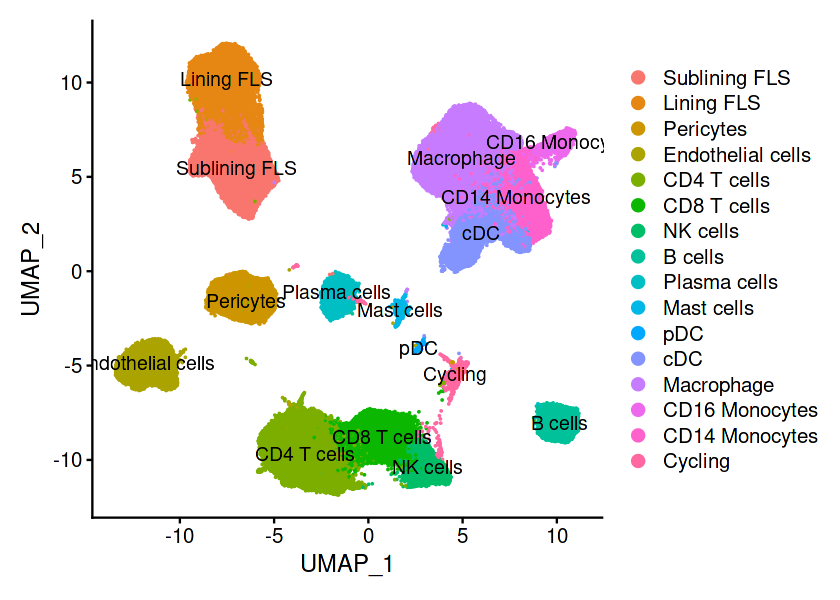

In [84]:
options(repr.plot.width=7, repr.plot.height=5)
DimPlot(syno, raster=FALSE, label=TRUE)

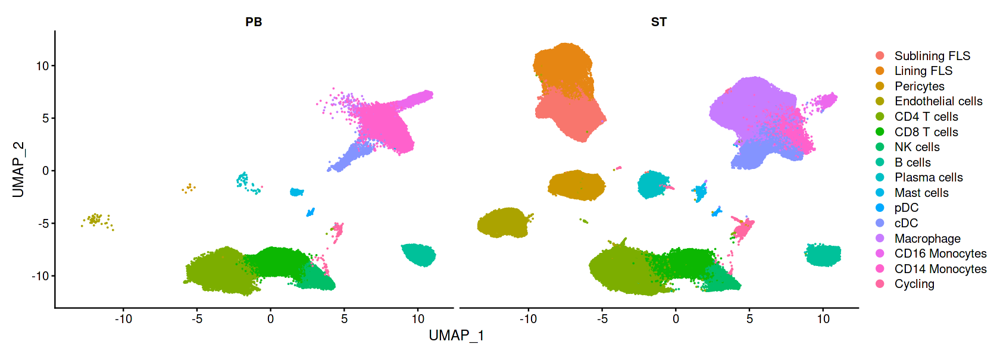

In [85]:
options(repr.plot.width=14, repr.plot.height=5)
DimPlot(syno, raster=FALSE, split.by="Tissue",label=FALSE)

# Find cluster markers

In [91]:
cluster.markers <- FindAllMarkers(syno, only.pos=TRUE, test.use="MAST", min.pct=0.4)
cluster.markers <- cluster.markers[which(cluster.markers$p_val_adj<0.05),]

Calculating cluster Sublining FLS


 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Com


 Completed [===================================>--------]  81% with 0 failures

 Completed [===================================>--------]  82% with 0 failures

 Completed [===================================>--------]  83% with 0 failures

 Completed [====================================>-------]  83% with 0 failures

 Completed [====================================>-------]  84% with 0 failures

 Completed [====================================>-------]  85% with 0 failures

 Completed [=====================================>------]  85% with 0 failures

 Completed [=====================================>------]  86% with 0 failures

 Completed [=====================================>------]  87% with 0 failures

 Completed [=====================================>------]  88% with 0 failures

 Completed [======================================>-----]  88% with 0 failures

 Completed [======================================>-----]  89% with 0 failures

 Completed [===========================


 Completed [=========================>------------------]  58% with 0 failures

 Completed [=========================>------------------]  59% with 0 failures

 Completed [=========================>------------------]  60% with 0 failures

 Completed [==========================>-----------------]  60% with 0 failures

 Completed [==========================>-----------------]  61% with 0 failures

 Completed [==========================>-----------------]  62% with 0 failures

 Completed [===========================>----------------]  62% with 0 failures

 Completed [===========================>----------------]  63% with 0 failures

 Completed [===========================>----------------]  64% with 0 failures

 Completed [===========================>----------------]  65% with 0 failures

 Completed [============================>---------------]  65% with 0 failures

 Completed [============================>---------------]  66% with 0 failures

 Completed [===========================


 Completed [=============>------------------------------]  33% with 0 failures

 Completed [==============>-----------------------------]  33% with 0 failures

 Completed [==============>-----------------------------]  34% with 0 failures

 Completed [==============>-----------------------------]  35% with 0 failures

 Completed [===============>----------------------------]  35% with 0 failures

 Completed [===============>----------------------------]  36% with 0 failures

 Completed [===============>----------------------------]  37% with 0 failures

 Completed [================>---------------------------]  38% with 0 failures

 Completed [================>---------------------------]  39% with 0 failures

 Completed [================>---------------------------]  40% with 0 failures

 Completed [=================>--------------------------]  40% with 0 failures

 Completed [=================>--------------------------]  41% with 0 failures

 Completed [=================>---------


 Completed [=>------------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [=====>---------------------


 Completed [==================================>---------]  81% with 0 failures

 Completed [===================================>--------]  81% with 0 failures

 Completed [===================================>--------]  82% with 0 failures

 Completed [===================================>--------]  83% with 0 failures

 Completed [====================================>-------]  83% with 0 failures

 Completed [====================================>-------]  84% with 0 failures

 Completed [====================================>-------]  85% with 0 failures

 Completed [=====================================>------]  85% with 0 failures

 Completed [=====================================>------]  86% with 0 failures

 Completed [=====================================>------]  87% with 0 failures

 Completed [======================================>-----]  88% with 0 failures

 Completed [======================================>-----]  89% with 0 failures

 Completed [===========================


 Completed [==========================>-----------------]  60% with 0 failures

 Completed [==========================>-----------------]  61% with 0 failures

 Completed [==========================>-----------------]  62% with 0 failures

 Completed [===========================>----------------]  62% with 0 failures

 Completed [===========================>----------------]  63% with 0 failures

 Completed [===========================>----------------]  64% with 0 failures

 Completed [============================>---------------]  65% with 0 failures

 Completed [============================>---------------]  66% with 0 failures

 Completed [============================>---------------]  67% with 0 failures

 Completed [=============================>--------------]  68% with 0 failures

 Completed [=============================>--------------]  69% with 0 failures

 Completed [==============================>-------------]  70% with 0 failures

 Completed [===========================


 Completed [=================>--------------------------]  40% with 0 failures

 Completed [=================>--------------------------]  41% with 0 failures

 Completed [=================>--------------------------]  42% with 0 failures

 Completed [==================>-------------------------]  42% with 0 failures

 Completed [==================>-------------------------]  43% with 0 failures

 Completed [==================>-------------------------]  44% with 0 failures

 Completed [===================>------------------------]  44% with 0 failures

 Completed [===================>------------------------]  45% with 0 failures

 Completed [===================>------------------------]  46% with 0 failures

 Completed [====================>-----------------------]  47% with 0 failures

 Completed [====================>-----------------------]  48% with 0 failures

 Completed [=====================>----------------------]  49% with 0 failures

 Completed [=====================>-----


 Completed [=========>----------------------------------]  22% with 0 failures

 Completed [=========>----------------------------------]  23% with 0 failures

 Completed [==========>---------------------------------]  24% with 0 failures

 Completed [==========>---------------------------------]  25% with 0 failures

 Completed [==========>---------------------------------]  26% with 0 failures

 Completed [===========>--------------------------------]  27% with 0 failures

 Completed [===========>--------------------------------]  28% with 0 failures

 Completed [============>-------------------------------]  29% with 0 failures

 Completed [============>-------------------------------]  30% with 0 failures

 Completed [============>-------------------------------]  31% with 0 failures

 Completed [=============>------------------------------]  31% with 0 failures

 Completed [=============>------------------------------]  32% with 0 failures

 Completed [=============>-------------


 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 Completed [==>-----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   8% with 0 failures

 Completed [===>----------------------------------------]   9% with 0 failures

 Completed [===>----------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [======>--------------------


 Completed [=======================================>----]  91% with 0 failures

 Completed [=======================================>----]  92% with 0 failures

 Completed [========================================>---]  92% with 0 failures

 Completed [========================================>---]  93% with 0 failures

 Completed [========================================>---]  94% with 0 failures

 Completed [=========================================>--]  95% with 0 failures

 Completed [=========================================>--]  96% with 0 failures

 Completed [==========================================>-]  97% with 0 failures

 Completed [==========================================>-]  98% with 0 failures

 Completed [==========================================>-]  99% with 0 failures

 Completed [===========================================>]  99% with 0 failures

 Completed [===========================================>] 100% with 0 failures

 Completed [===========================


 Completed [============================>---------------]  65% with 0 failures

 Completed [============================>---------------]  66% with 0 failures

 Completed [============================>---------------]  67% with 0 failures

 Completed [=============================>--------------]  67% with 0 failures

 Completed [=============================>--------------]  68% with 0 failures

 Completed [=============================>--------------]  69% with 0 failures

 Completed [==============================>-------------]  69% with 0 failures

 Completed [==============================>-------------]  70% with 0 failures

 Completed [==============================>-------------]  71% with 0 failures

 Completed [===============================>------------]  72% with 0 failures

 Completed [===============================>------------]  73% with 0 failures

 Completed [===============================>------------]  74% with 0 failures

 Completed [===========================


 Completed [================>---------------------------]  38% with 0 failures

 Completed [================>---------------------------]  39% with 0 failures

 Completed [================>---------------------------]  40% with 0 failures

 Completed [=================>--------------------------]  40% with 0 failures

 Completed [=================>--------------------------]  41% with 0 failures

 Completed [=================>--------------------------]  42% with 0 failures

 Completed [==================>-------------------------]  42% with 0 failures

 Completed [==================>-------------------------]  43% with 0 failures

 Completed [==================>-------------------------]  44% with 0 failures

 Completed [===================>------------------------]  44% with 0 failures

 Completed [===================>------------------------]  45% with 0 failures

 Completed [===================>------------------------]  46% with 0 failures

 Completed [====================>------


 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [=====>--------------------------------------]  15% with 0 failures

 Completed [======>-------------------------------------]  15% with 0 failures

 Completed [======>-------------------------------------]  16% with 0 failures

 Completed [======>-------------------------------------]  17% with 0 failures

 Completed [=======>------------------------------------]  17% with 0 failures

 Completed [=======>------------------------------------]  18% with 0 failures

 Completed [=======>------------------------------------]  19% with 0 failures

 Completed [========>-----------------------------------]  20% with 0 failures

 Completed [========>------------------


 Completed [========================================>---]  94% with 0 failures

 Completed [=========================================>--]  94% with 0 failures

 Completed [=========================================>--]  95% with 0 failures

 Completed [=========================================>--]  96% with 0 failures

 Completed [=========================================>--]  97% with 0 failures

 Completed [==========================================>-]  97% with 0 failures

 Completed [==========================================>-]  98% with 0 failures

 Completed [==========================================>-]  99% with 0 failures

 Completed [===========================================>]  99% with 0 failures

 Completed [===========================================>] 100% with 0 failures

 Completed [============================================] 100% with 0 failures
                                                                              


Done!

Combining coefficients and stand


 Completed [==============================>-------------]  71% with 0 failures

 Completed [===============================>------------]  72% with 0 failures

 Completed [===============================>------------]  73% with 0 failures

 Completed [===============================>------------]  74% with 0 failures

 Completed [================================>-----------]  74% with 0 failures

 Completed [================================>-----------]  75% with 0 failures

 Completed [================================>-----------]  76% with 0 failures

 Completed [=================================>----------]  76% with 0 failures

 Completed [=================================>----------]  77% with 0 failures

 Completed [=================================>----------]  78% with 0 failures

 Completed [==================================>---------]  79% with 0 failures

 Completed [==================================>---------]  80% with 0 failures

 Completed [===========================


 Completed [====================>-----------------------]  47% with 0 failures

 Completed [====================>-----------------------]  48% with 0 failures

 Completed [====================>-----------------------]  49% with 0 failures

 Completed [=====================>----------------------]  49% with 0 failures

 Completed [=====================>----------------------]  50% with 0 failures

 Completed [=====================>----------------------]  51% with 0 failures

 Completed [======================>---------------------]  51% with 0 failures

 Completed [======================>---------------------]  52% with 0 failures

 Completed [======================>---------------------]  53% with 0 failures

 Completed [=======================>--------------------]  54% with 0 failures

 Completed [=======================>--------------------]  55% with 0 failures

 Completed [=======================>--------------------]  56% with 0 failures

 Completed [========================>--


 Completed [========>-----------------------------------]  22% with 0 failures

 Completed [=========>----------------------------------]  22% with 0 failures

 Completed [=========>----------------------------------]  23% with 0 failures

 Completed [=========>----------------------------------]  24% with 0 failures

 Completed [==========>---------------------------------]  24% with 0 failures

 Completed [==========>---------------------------------]  25% with 0 failures

 Completed [==========>---------------------------------]  26% with 0 failures

 Completed [===========>--------------------------------]  26% with 0 failures

 Completed [===========>--------------------------------]  27% with 0 failures

 Completed [===========>--------------------------------]  28% with 0 failures

 Completed [============>-------------------------------]  29% with 0 failures

 Completed [============>-------------------------------]  30% with 0 failures

 Completed [=============>-------------


 Completed [===========================================>] 100% with 0 failures

 Completed [============================================] 100% with 0 failures
                                                                              


Done!

Calculating cluster B cells


 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------------]   5% with 0 failures

 Completed [==>-----------------------------------------]   6% with 0 failures

 Completed [==>-----------------------------------------]   7% with 0 failures

 C


 Completed [=================================>----------]  77% with 0 failures

 Completed [=================================>----------]  78% with 0 failures

 Completed [==================================>---------]  79% with 0 failures

 Completed [==================================>---------]  80% with 0 failures

 Completed [===================================>--------]  81% with 0 failures

 Completed [===================================>--------]  82% with 0 failures

 Completed [===================================>--------]  83% with 0 failures

 Completed [====================================>-------]  83% with 0 failures

 Completed [====================================>-------]  84% with 0 failures

 Completed [====================================>-------]  85% with 0 failures

 Completed [=====================================>------]  86% with 0 failures

 Completed [=====================================>------]  87% with 0 failures

 Completed [===========================


 Completed [=======================>--------------------]  56% with 0 failures

 Completed [========================>-------------------]  56% with 0 failures

 Completed [========================>-------------------]  57% with 0 failures

 Completed [========================>-------------------]  58% with 0 failures

 Completed [=========================>------------------]  58% with 0 failures

 Completed [=========================>------------------]  59% with 0 failures

 Completed [=========================>------------------]  60% with 0 failures

 Completed [==========================>-----------------]  60% with 0 failures

 Completed [==========================>-----------------]  61% with 0 failures

 Completed [==========================>-----------------]  62% with 0 failures

 Completed [===========================>----------------]  63% with 0 failures

 Completed [===========================>----------------]  64% with 0 failures

 Completed [===========================


 Completed [======================>---------------------]  52% with 0 failures

 Completed [======================>---------------------]  53% with 0 failures

 Completed [=======================>--------------------]  55% with 0 failures

 Completed [========================>-------------------]  56% with 0 failures

 Completed [========================>-------------------]  57% with 0 failures

 Completed [=========================>------------------]  58% with 0 failures

 Completed [=========================>------------------]  60% with 0 failures

 Completed [==========================>-----------------]  61% with 0 failures

 Completed [==========================>-----------------]  62% with 0 failures

 Completed [===========================>----------------]  64% with 0 failures

 Completed [============================>---------------]  65% with 0 failures

 Completed [============================>---------------]  66% with 0 failures

 Completed [===========================


 Completed [======================>---------------------]  53% with 0 failures

 Completed [=======================>--------------------]  54% with 0 failures

 Completed [=======================>--------------------]  55% with 0 failures

 Completed [========================>-------------------]  56% with 0 failures

 Completed [========================>-------------------]  57% with 0 failures

 Completed [========================>-------------------]  58% with 0 failures

 Completed [=========================>------------------]  58% with 0 failures

 Completed [=========================>------------------]  59% with 0 failures

 Completed [=========================>------------------]  60% with 0 failures

 Completed [==========================>-----------------]  61% with 0 failures

 Completed [==========================>-----------------]  62% with 0 failures

 Completed [===========================>----------------]  62% with 0 failures

 Completed [===========================


 Completed [===============>----------------------------]  36% with 0 failures

 Completed [===============>----------------------------]  37% with 0 failures

 Completed [===============>----------------------------]  38% with 0 failures

 Completed [================>---------------------------]  38% with 0 failures

 Completed [================>---------------------------]  39% with 0 failures

 Completed [=================>--------------------------]  40% with 0 failures

 Completed [=================>--------------------------]  41% with 0 failures

 Completed [=================>--------------------------]  42% with 0 failures

 Completed [==================>-------------------------]  42% with 0 failures

 Completed [==================>-------------------------]  43% with 0 failures

 Completed [==================>-------------------------]  44% with 0 failures

 Completed [===================>------------------------]  45% with 0 failures

 Completed [===================>-------


 Completed [======>-------------------------------------]  16% with 0 failures

 Completed [======>-------------------------------------]  17% with 0 failures

 Completed [=======>------------------------------------]  17% with 0 failures

 Completed [=======>------------------------------------]  18% with 0 failures

 Completed [=======>------------------------------------]  19% with 0 failures

 Completed [========>-----------------------------------]  19% with 0 failures

 Completed [========>-----------------------------------]  20% with 0 failures

 Completed [========>-----------------------------------]  21% with 0 failures

 Completed [=========>----------------------------------]  22% with 0 failures

 Completed [=========>----------------------------------]  23% with 0 failures

 Completed [=========>----------------------------------]  24% with 0 failures

 Completed [==========>---------------------------------]  24% with 0 failures

 Completed [==========>----------------


 Completed [========================================>---]  92% with 0 failures

 Completed [========================================>---]  93% with 0 failures

 Completed [========================================>---]  94% with 0 failures

 Completed [=========================================>--]  94% with 0 failures

 Completed [=========================================>--]  95% with 0 failures

 Completed [=========================================>--]  96% with 0 failures

 Completed [=========================================>--]  97% with 0 failures

 Completed [==========================================>-]  97% with 0 failures

 Completed [==========================================>-]  98% with 0 failures

 Completed [==========================================>-]  99% with 0 failures

 Completed [===========================================>]  99% with 0 failures

 Completed [===========================================>] 100% with 0 failures

 Completed [===========================


 Completed [===========================>----------------]  65% with 0 failures

 Completed [============================>---------------]  65% with 0 failures

 Completed [============================>---------------]  66% with 0 failures

 Completed [============================>---------------]  67% with 0 failures

 Completed [=============================>--------------]  67% with 0 failures

 Completed [=============================>--------------]  68% with 0 failures

 Completed [=============================>--------------]  69% with 0 failures

 Completed [==============================>-------------]  69% with 0 failures

 Completed [==============================>-------------]  70% with 0 failures

 Completed [==============================>-------------]  71% with 0 failures

 Completed [==============================>-------------]  72% with 0 failures

 Completed [===============================>------------]  72% with 0 failures

 Completed [===========================


 Completed [================>---------------------------]  40% with 0 failures

 Completed [=================>--------------------------]  40% with 0 failures

 Completed [=================>--------------------------]  41% with 0 failures

 Completed [=================>--------------------------]  42% with 0 failures

 Completed [==================>-------------------------]  42% with 0 failures

 Completed [==================>-------------------------]  43% with 0 failures

 Completed [==================>-------------------------]  44% with 0 failures

 Completed [===================>------------------------]  45% with 0 failures

 Completed [===================>------------------------]  46% with 0 failures

 Completed [===================>------------------------]  47% with 0 failures

 Completed [====================>-----------------------]  47% with 0 failures

 Completed [====================>-----------------------]  48% with 0 failures

 Completed [====================>------


 Completed [======>-------------------------------------]  15% with 0 failures

 Completed [======>-------------------------------------]  16% with 0 failures

 Completed [======>-------------------------------------]  17% with 0 failures

 Completed [=======>------------------------------------]  17% with 0 failures

 Completed [=======>------------------------------------]  18% with 0 failures

 Completed [=======>------------------------------------]  19% with 0 failures

 Completed [========>-----------------------------------]  19% with 0 failures

 Completed [========>-----------------------------------]  20% with 0 failures

 Completed [========>-----------------------------------]  21% with 0 failures

 Completed [=========>----------------------------------]  22% with 0 failures

 Completed [=========>----------------------------------]  23% with 0 failures

 Completed [=========>----------------------------------]  24% with 0 failures

 Completed [==========>----------------


 Completed [=========================================>--]  94% with 0 failures

 Completed [=========================================>--]  95% with 0 failures

 Completed [=========================================>--]  96% with 0 failures

 Completed [==========================================>-]  97% with 0 failures

 Completed [==========================================>-]  98% with 0 failures

 Completed [==========================================>-]  99% with 0 failures

 Completed [===========================================>]  99% with 0 failures

 Completed [===========================================>] 100% with 0 failures

 Completed [============================================] 100% with 0 failures
                                                                              


Done!

Calculating cluster Macrophage


 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures



 Completed [=============================>--------------]  68% with 0 failures

 Completed [=============================>--------------]  69% with 0 failures

 Completed [==============================>-------------]  69% with 0 failures

 Completed [==============================>-------------]  70% with 0 failures

 Completed [==============================>-------------]  71% with 0 failures

 Completed [==============================>-------------]  72% with 0 failures

 Completed [===============================>------------]  72% with 0 failures

 Completed [===============================>------------]  73% with 0 failures

 Completed [===============================>------------]  74% with 0 failures

 Completed [================================>-----------]  74% with 0 failures

 Completed [================================>-----------]  75% with 0 failures

 Completed [================================>-----------]  76% with 0 failures

 Completed [===========================


 Completed [================>---------------------------]  40% with 0 failures

 Completed [=================>--------------------------]  40% with 0 failures

 Completed [=================>--------------------------]  41% with 0 failures

 Completed [=================>--------------------------]  42% with 0 failures

 Completed [==================>-------------------------]  42% with 0 failures

 Completed [==================>-------------------------]  43% with 0 failures

 Completed [==================>-------------------------]  44% with 0 failures

 Completed [===================>------------------------]  44% with 0 failures

 Completed [===================>------------------------]  45% with 0 failures

 Completed [===================>------------------------]  46% with 0 failures

 Completed [====================>-----------------------]  47% with 0 failures

 Completed [====================>-----------------------]  48% with 0 failures

 Completed [====================>------


 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [=====>--------------------------------------]  15% with 0 failures

 Completed [======>-------------------------------------]  15% with 0 failures

 Completed [======>-------------------------------------]  16% with 0 failures

 Completed [======>-------------------------------------]  17% with 0 failures

 Completed [=======>------------------------------------]  17% with 0 failures

 Completed [=======>------------------------------------]  18% with 0 failures

 Completed [=======>------------------------------------]  19% with 0 failures

 Completed [========>-----------------------------------]  19% with 0 failures

 Completed [========>-----------------------------------]  20% with 0 failures

 Completed [========>------------------


 Completed [=====================================>------]  85% with 0 failures

 Completed [=====================================>------]  86% with 0 failures

 Completed [=====================================>------]  87% with 0 failures

 Completed [======================================>-----]  88% with 0 failures

 Completed [======================================>-----]  89% with 0 failures

 Completed [======================================>-----]  90% with 0 failures

 Completed [=======================================>----]  90% with 0 failures

 Completed [=======================================>----]  91% with 0 failures

 Completed [=======================================>----]  92% with 0 failures

 Completed [========================================>---]  92% with 0 failures

 Completed [========================================>---]  93% with 0 failures

 Completed [========================================>---]  94% with 0 failures

 Completed [===========================


 Completed [=======================>--------------------]  56% with 0 failures

 Completed [========================>-------------------]  56% with 0 failures

 Completed [========================>-------------------]  57% with 0 failures

 Completed [========================>-------------------]  58% with 0 failures

 Completed [=========================>------------------]  58% with 0 failures

 Completed [=========================>------------------]  59% with 0 failures

 Completed [=========================>------------------]  60% with 0 failures

 Completed [==========================>-----------------]  60% with 0 failures

 Completed [==========================>-----------------]  61% with 0 failures

 Completed [==========================>-----------------]  62% with 0 failures

 Completed [===========================>----------------]  63% with 0 failures

 Completed [===========================>----------------]  64% with 0 failures

 Completed [===========================


 Completed [===========>--------------------------------]  26% with 0 failures

 Completed [===========>--------------------------------]  27% with 0 failures

 Completed [===========>--------------------------------]  28% with 0 failures

 Completed [============>-------------------------------]  28% with 0 failures

 Completed [============>-------------------------------]  29% with 0 failures

 Completed [============>-------------------------------]  30% with 0 failures

 Completed [============>-------------------------------]  31% with 0 failures

 Completed [=============>------------------------------]  31% with 0 failures

 Completed [=============>------------------------------]  32% with 0 failures

 Completed [=============>------------------------------]  33% with 0 failures

 Completed [==============>-----------------------------]  33% with 0 failures

 Completed [==============>-----------------------------]  34% with 0 failures

 Completed [==============>------------


 Completed [===========================================>] 100% with 0 failures

 Completed [============================================] 100% with 0 failures
                                                                              


Done!

Combining coefficients and standard errors

Calculating log-fold changes

Calculating likelihood ratio tests

Refitting on reduced model...


 Completed [--------------------------------------------]   0% with 0 failures

 Completed [--------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   1% with 0 failures

 Completed [>-------------------------------------------]   2% with 0 failures

 Completed [>-------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   3% with 0 failures

 Completed [=>------------------------------------------]   4% with 0 failures

 Completed [=>------------------------------------


 Completed [==============================>-------------]  70% with 0 failures

 Completed [==============================>-------------]  71% with 0 failures

 Completed [==============================>-------------]  72% with 0 failures

 Completed [===============================>------------]  72% with 0 failures

 Completed [===============================>------------]  73% with 0 failures

 Completed [===============================>------------]  74% with 0 failures

 Completed [================================>-----------]  74% with 0 failures

 Completed [================================>-----------]  75% with 0 failures

 Completed [================================>-----------]  76% with 0 failures

 Completed [=================================>----------]  76% with 0 failures

 Completed [=================================>----------]  77% with 0 failures

 Completed [=================================>----------]  78% with 0 failures

 Completed [===========================


 Completed [=================>--------------------------]  41% with 0 failures

 Completed [=================>--------------------------]  42% with 0 failures

 Completed [==================>-------------------------]  42% with 0 failures

 Completed [==================>-------------------------]  43% with 0 failures

 Completed [==================>-------------------------]  44% with 0 failures

 Completed [===================>------------------------]  44% with 0 failures

 Completed [===================>------------------------]  45% with 0 failures

 Completed [===================>------------------------]  46% with 0 failures

 Completed [===================>------------------------]  47% with 0 failures

 Completed [====================>-----------------------]  47% with 0 failures

 Completed [====================>-----------------------]  48% with 0 failures

 Completed [====================>-----------------------]  49% with 0 failures

 Completed [=====================>-----


 Completed [====>---------------------------------------]  10% with 0 failures

 Completed [====>---------------------------------------]  11% with 0 failures

 Completed [====>---------------------------------------]  12% with 0 failures

 Completed [=====>--------------------------------------]  13% with 0 failures

 Completed [=====>--------------------------------------]  14% with 0 failures

 Completed [=====>--------------------------------------]  15% with 0 failures

 Completed [======>-------------------------------------]  15% with 0 failures

 Completed [======>-------------------------------------]  16% with 0 failures

 Completed [======>-------------------------------------]  17% with 0 failures

 Completed [=======>------------------------------------]  17% with 0 failures

 Completed [=======>------------------------------------]  18% with 0 failures

 Completed [=======>------------------------------------]  19% with 0 failures

 Completed [========>------------------


 Completed [====================================>-------]  84% with 0 failures

 Completed [====================================>-------]  85% with 0 failures

 Completed [=====================================>------]  85% with 0 failures

 Completed [=====================================>------]  86% with 0 failures

 Completed [=====================================>------]  87% with 0 failures

 Completed [======================================>-----]  88% with 0 failures

 Completed [======================================>-----]  89% with 0 failures

 Completed [======================================>-----]  90% with 0 failures

 Completed [=======================================>----]  90% with 0 failures

 Completed [=======================================>----]  91% with 0 failures

 Completed [=======================================>----]  92% with 0 failures

 Completed [========================================>---]  92% with 0 failures

 Completed [===========================

In [92]:
top5 <- cluster.markers %>%
    group_by(cluster) %>%
    slice_max(n = 5, order_by = avg_log2FC)

In [93]:
top20 <- cluster.markers %>%
    group_by(cluster) %>%
    slice_max(n = 20, order_by = avg_log2FC)

In [94]:
top20[top20$cluster=="22",]

p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>


In [95]:
syno@misc <- cluster.markers

In [96]:
cluster.markers <- syno@misc

In [97]:
write.csv(cluster.markers, "pb.syno_cluster.markers.csv")

# Make scaled expression heatmap of top 5 markers

In [98]:
cluster.markers <- as.data.frame(cluster.markers)

# Make AvgLogFC heatmap of top 5 markers

In [99]:
library(data.table)
# pick signficant genes to show in the heatmap
# arrange the genes such that the gene with max logFC is at the center and values decrease as we move away from center
genes_use_df<-data.table(cluster.markers)[
    p_val_adj<0.05][
    , .SD[order(-avg_log2FC)][1:20, ], by = cluster][
    , .SD[!is.na(gene)]][
    , .SD[order(avg_log2FC)], by = cluster][
    , ":=" (len = .N, rank = frank(avg_log2FC)), by = cluster][
    , .SD[c(seq(1, round(.SD$len[1]/3), 1), seq(.SD$len[1], round(.SD$len[1]/3)+1, -1)), ], by = cluster][
    , .(gene, avg_log2FC, cluster, p_val_adj) 
]



Attaching package: ‘data.table’


The following objects are masked from ‘package:dplyr’:

    between, first, last




In [100]:
#Organise genes we want to include by cluster
genes_use_df <- genes_use_df %>% distinct(gene, .keep_all = TRUE) %>% arrange(cluster)
genes_use_df[, .SD[order(-avg_log2FC)][1:5, ], by = cluster]

cluster,gene,avg_log2FC,p_val_adj
<fct>,<chr>,<dbl>,<dbl>
Sublining FLS,DCN,4.984027,0
Sublining FLS,COL1A1,4.750351,0
Sublining FLS,COL3A1,4.717861,0
Sublining FLS,COL1A2,4.251625,0
Sublining FLS,MFAP5,4.078076,0
Lining FLS,PRG4,6.211498,0
Lining FLS,CRTAC1,4.757218,0
Lining FLS,HTRA1,4.684392,0
Lining FLS,CLU,4.270430,0


In [101]:
message("Checking that the genes are unique: ", nrow(genes_use_df) == length(unique(genes_use_df$gene)))
message("Number of genes in heatmap: ", nrow(genes_use_df))

 

# select the top 5 genes with highest logFC in each cluster and assign each gene to a cell type based on it logFC - the gene belongs to the celltype with higher logFC
genes_to_mark_celltypes<-genes_use_df[, .SD[order(-avg_log2FC)][1:5, ], by = cluster][
    , .(cluster, gene)
]

 

.mat<-cluster.markers %>% 
    subset(gene %in% genes_use_df$gene) %>% 
    dplyr::select(cluster, avg_log2FC, gene) %>% 
    tidyr::spread(cluster, avg_log2FC) %>% 
    tibble::column_to_rownames('gene') %>% 
    as.matrix() %>% t() 
.mat<-.mat[, genes_use_df$gene]
.mat[is.na(.mat)] <- 0

message(
    "Are all genes that are being marked also present in the matrix?: ", 
    length(setdiff(genes_to_mark_celltypes$gene, colnames(.mat))) == 0
)

 

genes_idx<-data.frame(idx = which(colnames(.mat) %in% genes_to_mark_celltypes$gene)) %>% 
    mutate(gene = colnames(.mat)[idx])

Checking that the genes are unique: TRUE

Number of genes in heatmap: 288

Are all genes that are being marked also present in the matrix?: TRUE



In [102]:
#Get the exact position of genes we wish to annotate in the matrix
genes_to_mark_celltypes<-genes_to_mark_celltypes %>% left_join(unique(genes_idx), by = "gene")

genes_to_mark_celltypes %>% arrange(cluster)


cluster,gene,idx
<fct>,<chr>,<int>
Sublining FLS,DCN,8
Sublining FLS,COL1A1,9
Sublining FLS,COL3A1,10
Sublining FLS,COL1A2,11
Sublining FLS,MFAP5,12
Lining FLS,PRG4,28
Lining FLS,CRTAC1,29
Lining FLS,HTRA1,30
Lining FLS,CLU,31


In [19]:
clus.cols <- hue_pal()(length(levels(syno$celltype)))
names(clus.cols) <- levels(syno$celltype)

In [104]:

library(ComplexHeatmap)
options(repr.plot.width=15, repr.plot.height=5)

gene.anno<-columnAnnotation(
    col_ann = anno_mark(
        at = genes_to_mark_celltypes$idx,
        side = "bottom",
        labels = genes_to_mark_celltypes$gene)
    )

clust.anno<-columnAnnotation(show_legend = TRUE,
    cluster = genes_use_df$cluster,
    col = list(cluster=clus.cols))

 #ha2<-columnAnnotation(
#     celltypes = anno_block(
#         gp = gpar(fill = col_pal), 
#         labels = genes_use_df$contrast %>% unique

 

# ))
anno_mark(
        at = genes_to_mark_celltypes$idx,
        side = "bottom",
        labels = genes_to_mark_celltypes$gene)


Loading required package: grid

ComplexHeatmap version 2.15.4
Bioconductor page: http://bioconductor.org/packages/ComplexHeatmap/
Github page: https://github.com/jokergoo/ComplexHeatmap
Documentation: http://jokergoo.github.io/ComplexHeatmap-reference

If you use it in published research, please cite either one:
- Gu, Z. Complex Heatmap Visualization. iMeta 2022.
- Gu, Z. Complex heatmaps reveal patterns and correlations in multidimensional 
    genomic data. Bioinformatics 2016.


The new InteractiveComplexHeatmap package can directly export static 
complex heatmaps into an interactive Shiny app with zero effort. Have a try!

This message can be suppressed by:
  suppressPackageStartupMessages(library(ComplexHeatmap))
! pheatmap() has been masked by ComplexHeatmap::pheatmap(). Most of the arguments
   in the original pheatmap() are identically supported in the new function. You 
   can still use the original function by explicitly calling pheatmap::pheatmap().



Attaching package: ‘Co

An AnnotationFunction object
  function: anno_mark()
  position: column 
  items: -1 
  width: 1npc 
  height: 26.5194444444444mm 
  imported variable: .pos, labels_gp, extend, side, at2index, labels_rot, at, link_height, link_width, link_gp, at2labels, .scale, padding 
  subsettable variable: at 
  this object is subsettable

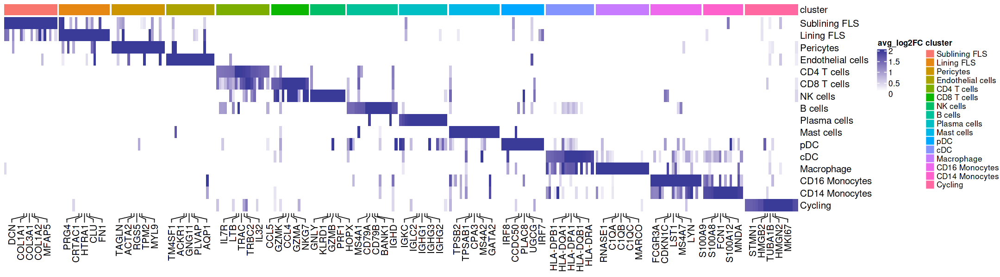

In [105]:
library(scales)
split<-genes_use_df$cluster
options(repr.plot.width=18, repr.plot.height=5)
colnames(.mat)<-NULL
.mat %>% 
    Heatmap(
        name = 'avg_log2FC',
        col = circlize::colorRamp2(c(0, 0.1, 2), c('white', 'white', muted('blue'))),
        #column_names_gp = grid::gpar(fontsize = 10),
#         row_dend_side = "right",
        cluster_rows = FALSE,
        cluster_columns = FALSE,
        top_annotation = clust.anno,
        column_title=NULL,
        bottom_annotation = gene.anno,
        column_split = split,
    )


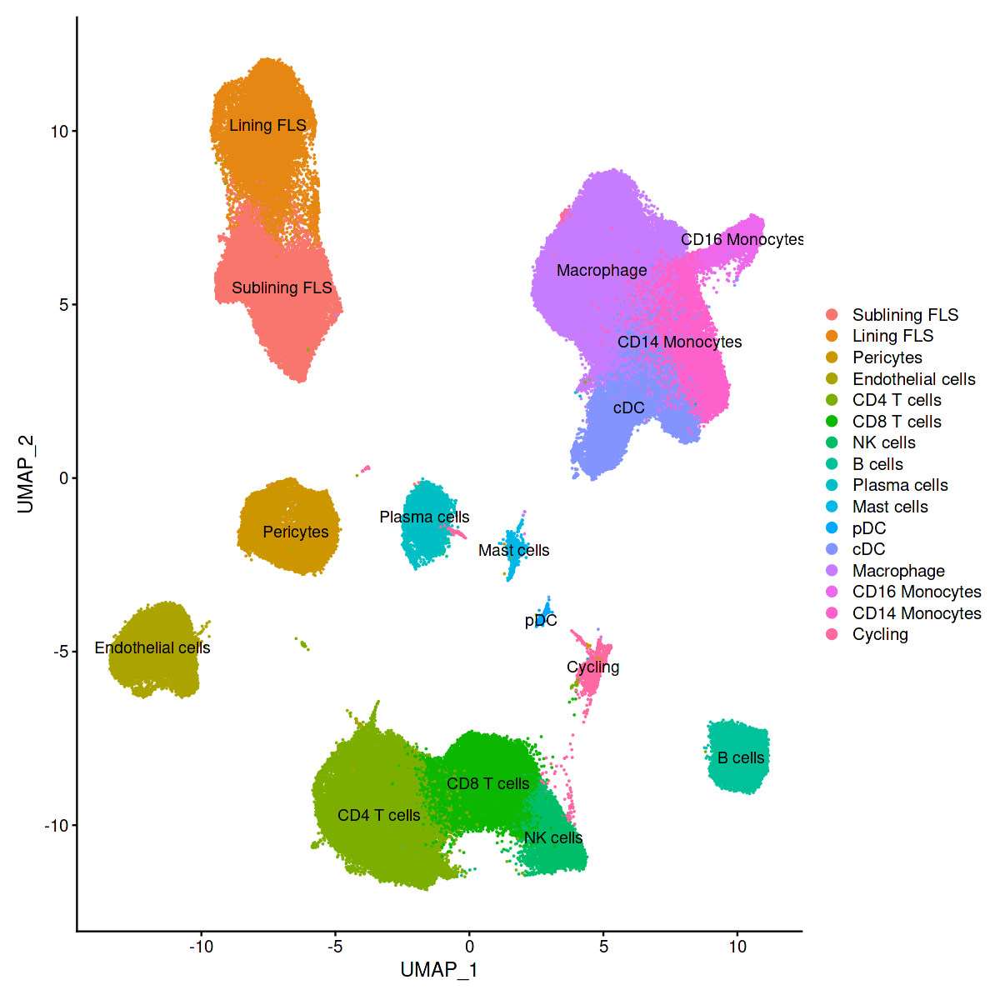

In [106]:
options(repr.plot.width=10, repr.plot.height=10)
DimPlot(syno, raster=FALSE, label=TRUE)

# Make detailed UMAP

In [107]:
#Rename your clusters by celltype
syno$Tissue <- plyr::revalue(as.character(syno$Tissue),
                                        c("PB"='Peripheral Blood (PB)', "ST"='Synovial Tissue (ST)'))

In [12]:
theme_specific <- theme_linedraw() + theme(panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank()) + theme(plot.title=element_text(size=30, face="bold"), axis.text=element_text(size=15), axis.title=element_text(size=15)) + theme(strip.background = element_rect(colour = "black", fill = "white"),strip.text = element_text(size = 20, color="black"))

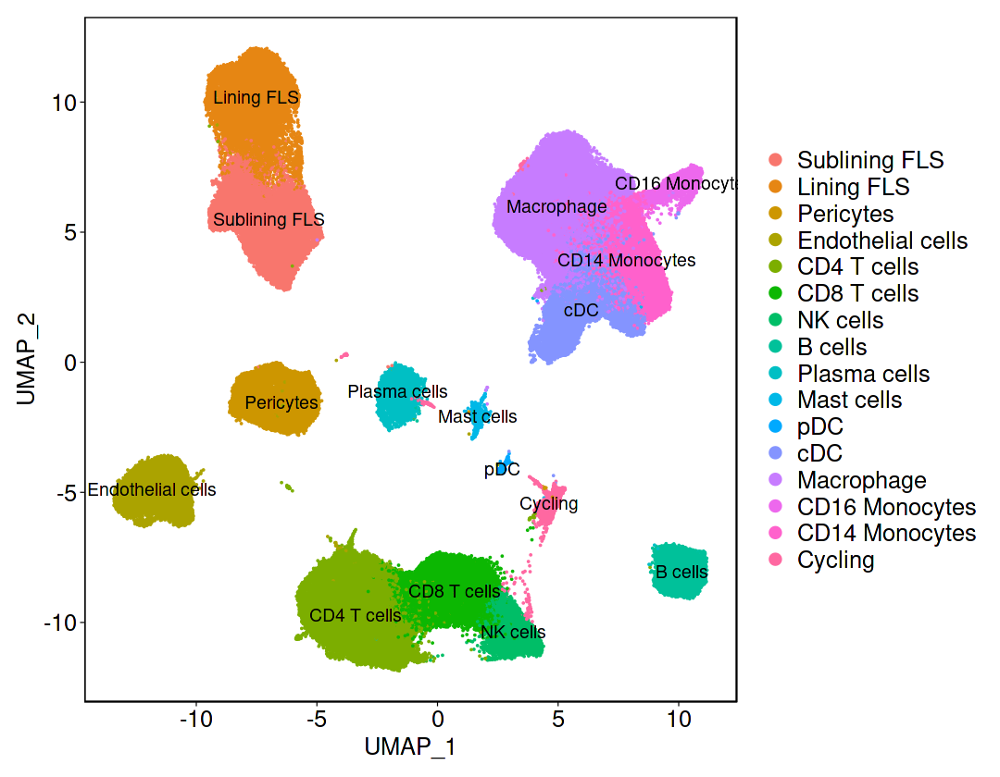

In [109]:
cluster.cols <- hue_pal()(length(unique(Idents(syno))))
options(repr.plot.width=9, repr.plot.height=7)
DimPlot(syno, cols=cluster.cols, group.by="celltype", raster=FALSE, label=TRUE) +NoLegend()+ theme_specific + theme(plot.title=element_blank(),legend.text=element_text(size=15))

In [14]:
#Create data frame for information required to plot 
umap <- data.frame(rownames(syno@meta.data),Embeddings(syno, reduction = "umap")[,1], Embeddings(syno, reduction = "umap")[,2],
                   syno$Tissue,syno$celltype)
colnames(umap) <- c("cellID","UMAP1", "UMAP2", "facet_col", "color_col")
allcells <-  as.data.frame(cbind(umap$UMAP1,umap$UMAP2))
colnames(allcells) <- c("UMAP1", "UMAP2")

In [15]:
umap$Cluster <- as.ordered(factor(umap$color_col, levels=levels(syno$celltype)))
umap <- umap[order(umap$color_col),]

In [16]:
umap <- umap[order(umap$cellID),]

In [17]:
#Get co-ordinates for the cluster labels
plt_df <- umap %>%  group_by(color_col) %>% 
        mutate(x_mid = median(UMAP1), y_mid = median(UMAP2), label_col = color_col) %>% 
        ungroup() %>% sample_frac(1)
head(plt_df)

cellID,UMAP1,UMAP2,facet_col,color_col,Cluster,x_mid,y_mid,label_col
<chr>,<dbl>,<dbl>,<chr>,<fct>,<ord>,<dbl>,<dbl>,<fct>
6666247_4,-6.194396,-1.254435,ST,Pericytes,Pericytes,-6.466034,-1.552413,Pericytes
TCCTTCTCAATTCTTC-1_3_3,-5.257619,4.501656,ST,Sublining FLS,Sublining FLS,-7.003064,5.488464,Sublining FLS
CTTCCGAGTTAGGCCC-1_7_6,-3.944552,-10.364169,ST,CD4 T cells,CD4 T cells,-3.381840,-9.705166,CD4 T cells
TACAGGTCAAACTCTG-1_4_3,-8.537427,9.196077,ST,Lining FLS,Lining FLS,-7.514331,10.179890,Lining FLS
ATCCGTCCAACCAGAG-1_9_39_1,4.427520,4.817227,ST,Macrophage,Macrophage,4.965912,6.001930,Macrophage
GCCAGTGTCCCAGTGG-1_3_29_1,2.477779,-9.061092,PB,NK cells,NK cells,3.150997,-10.349140,NK cells


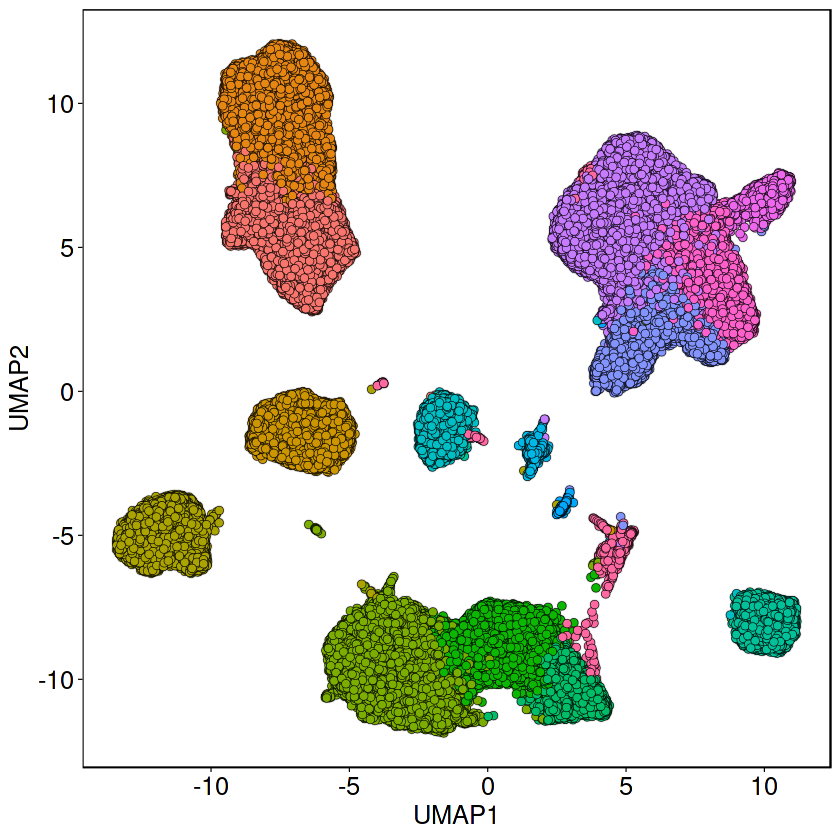

In [24]:
options(repr.plot.width=7, repr.plot.height=7)
ggplot(umap, aes(x=UMAP1, y=UMAP2)) + 
  geom_point(data=allcells, colour="grey89", fill="grey89", size=2, shape=21) +
  geom_point(aes(fill=factor(Cluster)),color="black", size=2, shape=21, stroke = 1/5) + 
  scale_fill_manual(name=NULL, labels = levels(umap$Cluster), guide="legend", values=clus.cols) + 
theme_specific + guides(fill=FALSE) 

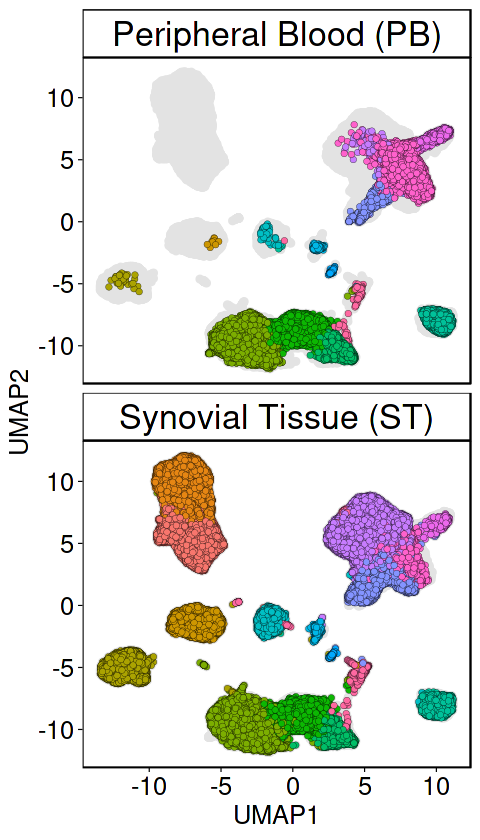

In [115]:
options(repr.plot.width=4, repr.plot.height=7)
ggplot(umap, aes(x=UMAP1, y=UMAP2)) + 
  geom_point(data=allcells, colour="grey89", fill="grey89", size=1.5, shape=21) +
  geom_point(aes(fill=factor(Cluster)),color="black", size=1.5, shape=21, stroke = 1/10) + facet_wrap(~facet_col, ncol=1) +
  scale_fill_manual(name=NULL, labels = levels(umap$color_col), guide="legend", values=clus.cols) + 
theme_specific + guides(fill=FALSE) 

In [116]:
unique(syno$group)

[1] "Healthy"                 "Naive RA"               
[3] "Remission RA"            "Resistant to cDMARDs RA"
[5] "Resistant to bDMARDs RA" "Difficult to treat RA"  
[7] "Arthralgia"

In [117]:
unique(syno$condition)

[1] "Healthy"      "Active RA"    "Remission RA" "Arthralgia"

In [118]:
#Rename your clusters by celltype
syno$Tissue <- plyr::revalue(as.character(syno$Tissue),
                                        c('Peripheral Blood (PB)'='PB', 'Synovial Tissue (ST)'="ST"))

In [119]:
unique(syno$Tissue)

[1] "ST" "PB"

In [120]:
syno$tissue_condition <- paste0(syno$Tissue, "_", syno$condition)

In [121]:
syno$tissue_condition <- as.ordered(factor(syno$tissue_condition, levels=c("PB_Healthy","PB_Active RA","ST_Healthy","ST_Active RA",
                                                    "ST_Remission RA")))

In [122]:
levels(syno$tissue_condition)

[1] "PB_Healthy"      "PB_Active RA"    "ST_Healthy"      "ST_Active RA"   
[5] "ST_Remission RA"

In [123]:
unique(syno$Donor)

[1] "HC0547"        "HC0572"        "HC0732"        "SA138"        
 [5] "SA146"         "SA172"         "SA132"         "SA160"        
 [9] "SA161"         "SA174"         "SA144"         "SA151"        
[13] "SA166"         "HC0701"        "SA131"         "SA145"        
[17] "SA139"         "SA159"         "SA168"         "SA220"        
[21] "SA222"         "SA225"         "SA227"         "SA272"        
[25] "SA271"         "SA276"         "PBMC_10X"      "A1"           
[29] "A10-RNA"       "A2_HTO2"       "A5_HTO5"       "A5_HTO3"      
[33] "A7_HTO5"       "A7_HTO4"       "A8"            "A9-RNA"       
[37] "A3"            "O1_PB_HD1_A"   "O1_PB_HD4_MS"  "O1_PB_HD3_ML" 
[41] "O1_PB_HD2_C"   "O3_PB_HD4_MS"  "O3_PB_HD3_ML"  "O3_PB_HD2_C"  
[45] "O3_PB_HD1_A"   "SeuratProject" "HSM_4029"      "HSM_4028"     
[49] "HSM_4027"      "HSM_3077"      "BM003_HET"     "SA572"        
[53] "SA492"         "SA457"         "SA458"         "SA565"        
[57] "SA563"         "SA541"         "SA614"         "SA612"        
[61] "SA619"         "SA600"         "SA636"         "SA658"

# Save data

In [86]:
saveRDS(syno, "./syno.rds")

In [6]:
syno <- readRDS("./syno.rds")

In [87]:
myeloid <- subset(syno, idents=c("Macrophage","cDC","CD14 Monocytes","CD16 Monocytes","Cycling"))
saveRDS(myeloid, "./myeloid_with.cycling.rds")

In [88]:
tcells <- subset(syno, idents=c("CD4 T cells","CD8 T cells","NK cells","Cycling"))
saveRDS(tcells, "./tcells.rds")

In [89]:
stromal <- subset(syno, idents=c("Sublining FLS","Lining FLS","Cycling"))
saveRDS(stromal, "./stromal.rds")

In [90]:
endo <- subset(syno, idents=c("Pericytes","Endothelial cells"))
saveRDS(endo, "./endo.rds")

In [7]:
syno.tissue <- subset(syno, subset = Tissue == "ST")

In [8]:
table(syno.tissue$Tissue)


    ST 
170406 

In [4]:
theme_specific <- theme_linedraw() + theme(panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank()) + theme(plot.title=element_text(size=30, face="bold"), axis.text=element_text(size=15), axis.title=element_text(size=15)) + theme(strip.background = element_rect(colour = "black", fill = "white"),strip.text = element_text(size = 20, color="black"))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


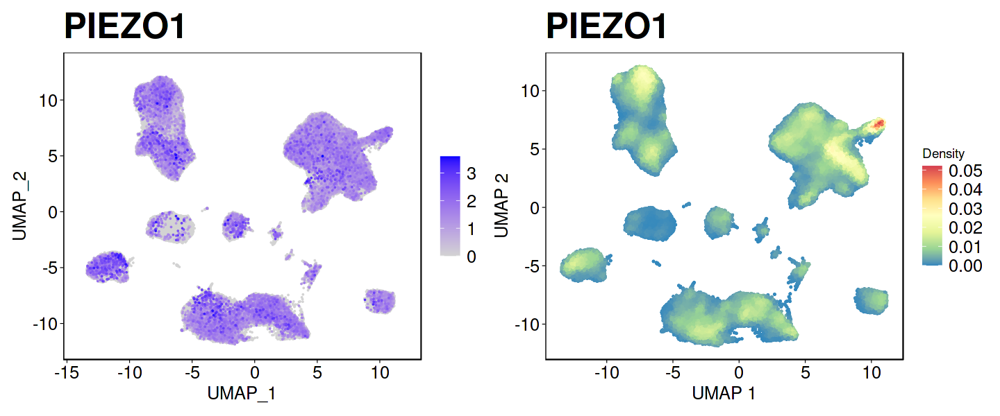

In [6]:
options(repr.plot.width=12, repr.plot.height=5)
p1 <- FeaturePlot(syno, "PIEZO1", order = TRUE, raster=FALSE) + theme_specific + theme(legend.text=element_text(size=15)) 
p2 <- plot_density(syno, "PIEZO1", reduction="umap") + theme_specific + theme(legend.text=element_text(size=15)) + scale_color_distiller(palette = "Spectral")  
p1 | p2

In [4]:
theme_specific <- theme_linedraw() + theme(panel.grid.major = element_blank(), panel.grid.minor = element_blank(),
panel.background = element_blank()) + theme(plot.title=element_text(size=30, face="bold"), axis.text=element_text(size=15), axis.title=element_text(size=15)) + theme(strip.background = element_rect(colour = "black", fill = "white"),strip.text = element_text(size = 20, color="black"))

Scale for colour is already present.
Adding another scale for colour, which will replace the existing scale.


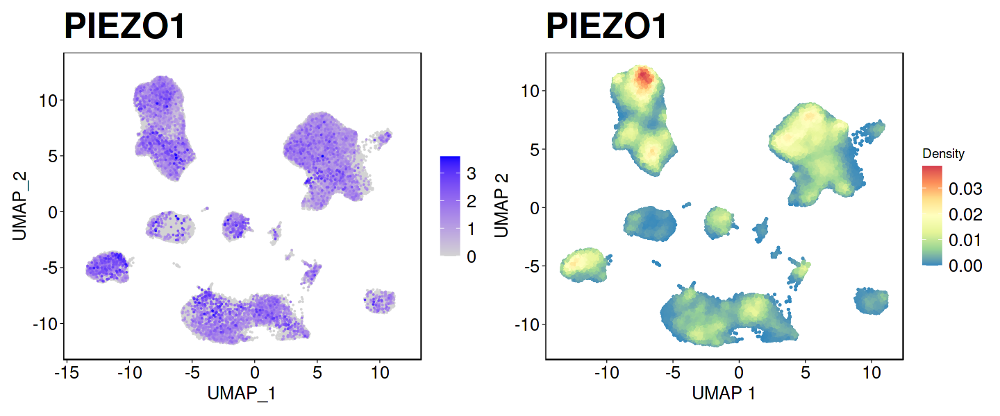

In [9]:
options(repr.plot.width=12, repr.plot.height=5)
p1 <- FeaturePlot(syno.tissue, "PIEZO1", order = TRUE, raster=FALSE) + theme_specific + theme(legend.text=element_text(size=15)) 
p2 <- plot_density(syno.tissue, "PIEZO1", reduction="umap") + theme_specific + theme(legend.text=element_text(size=15)) + scale_color_distiller(palette = "Spectral")  
p1 | p2

In [7]:
bmt <- subset(syno, subset = group == "Arthralgia")

In [8]:
bmt$snps.ident <- ifelse(bmt$snps.ident=="Donor", "Donor", "Recipient")

In [36]:
#Create data frame for information required to plot 
bmt.umap <- data.frame(rownames(bmt@meta.data),Embeddings(bmt, reduction = "umap")[,1], Embeddings(bmt, reduction = "umap")[,2],
                   bmt$snps.ident,bmt$snps.ident,bmt$celltype)
colnames(bmt.umap) <- c("ID","UMAP1", "UMAP2", "facet_col", "Group", "color_col")

allcells <-  as.data.frame(cbind(bmt.umap$UMAP1,bmt.umap$UMAP2))
colnames(allcells) <- c("UMAP1", "UMAP2")
bmt.umap$Cluster <- as.ordered(factor(bmt.umap$color_col, levels=levels(syno$celltype)))
bmt.umap <- bmt.umap[order(bmt.umap$color_col),]

[1] "Donor"     "Recipient"

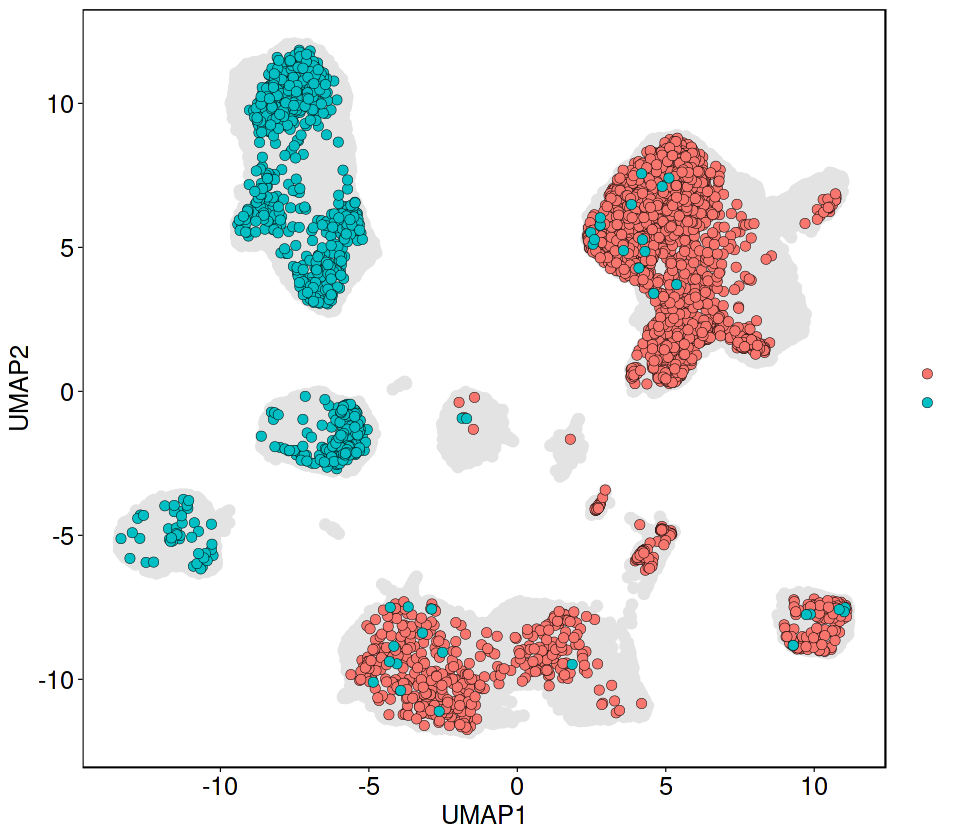

In [37]:
bmt.umap$Group <- as.ordered(factor(bmt.umap$Group, levels=c("Donor","Recipient")))
levels(bmt.umap$Group)
bmt.umap <- bmt.umap[complete.cases(bmt.umap$Group),]
bmt.umap <- bmt.umap[order(bmt.umap$Group),]
options(repr.plot.width=8, repr.plot.height=7)
ggplot() + 
  geom_point(data=umap, aes(x=UMAP1, y=UMAP2), colour="grey89", fill="grey89", size=2.5, shape=21) +
  geom_point(data=bmt.umap, aes(x=UMAP1, y=UMAP2, fill=Group),color="black", size=2.5, shape=21, stroke = 1/6)+
    scale_fill_manual(name=NULL, labels = levels(umap$Group), guide="legend", values=hue_pal()(2))  + theme_specific #+ guides(fill=FALSE) 

In [38]:
bmt.umap$Cluster <- as.factor(ordered(bmt.umap$Cluster, levels=c("Sublining FLS","Lining FLS","Pericytes","Endothelial cells","CD4 T cells","CD8 T cells","NK cells","B cells","Plasma cells","Mast cells","pDC","cDC","Macrophage","CD16 Monocytes","CD14 Monocytes","Cycling")))

In [39]:
unique(bmt.umap$Cluster)

[1] Sublining FLS     CD4 T cells       CD8 T cells       NK cells         
 [5] B cells           Plasma cells      Mast cells        pDC              
 [9] cDC               Macrophage        CD16 Monocytes    CD14 Monocytes   
[13] Cycling           Lining FLS        Pericytes         Endothelial cells
16 Levels: Sublining FLS < Lining FLS < Pericytes < ... < Cycling

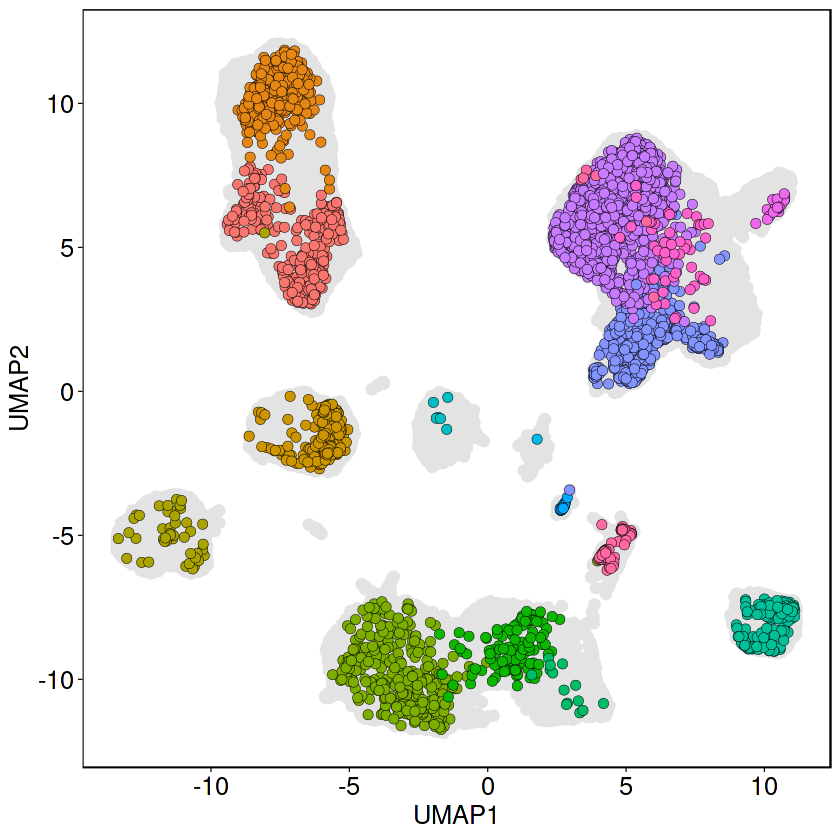

In [41]:
clus.cols <- hue_pal()(length(levels(bmt.umap$Cluster)))
options(repr.plot.width=7, repr.plot.height=7)
 ggplot() + 
  geom_point(data=umap, aes(x=UMAP1, y=UMAP2), colour="grey89", fill="grey89", size=2.5, shape=21) +
  geom_point(data=bmt.umap, aes(x=UMAP1, y=UMAP2, fill=Cluster),color="black", size=2.5, shape=21, stroke = 1/6)+
    scale_fill_manual(name=NULL, labels = levels(bmt.umap$Cluster), guide="legend", values=clus.cols)  + theme_specific + guides(fill=FALSE)  

# Map back annotations

In [2]:
myeloid <- readRDS("/datastore/lucy/TREM2development/renamed.myeloid.rds")

In [5]:
unique(myeloid$clusters)

[1] FOLR2highSELENOP+ Macrophage HMOX1+CRIP1+ Intermediate   
 [3] VSIG4+TREM2+ Macrophage      SDS+NR4A3+CXCR4+ iDC3       
 [5] CD14+FCGR3A+ Monocyte        FOLR2highLYVE1+ Macrophage  
 [7] KLF2+ATF3+EGR1+ Macrophage   CD1c+ cDC                   
 [9] BIRC5+ cycling precursors    FOLR2highC1QA+ Macrophage   
[11] CXCL10+STAT1+ Macrophage     ISG15+CXCL10+ Intermediate  
[13] CD14highS100A12+ Monocyte    FCGR3A+ Monocyte            
[15] IL1B+CXCL8+ Macrophage       SPP1+TREM2+ Macrophage      
[17] FOLR2highCLEC10A+ Macrophage SPP1+FCN1+ Macrophage       
18 Levels: CD14highS100A12+ Monocyte CD14+FCGR3A+ Monocyte ... BIRC5+ cycling precursors

In [7]:
myeloid.anno = as.data.frame(myeloid$clusters)
myeloid.anno$barcode<-rownames(myeloid.anno)
colnames(myeloid.anno) <- c("finetype","barcode")
head(myeloid.anno)

,finetype,barcode
,<fct>,<chr>
AAACCTGTCCGTAGTA-1_1_1_1,FOLR2highSELENOP+ Macrophage,AAACCTGTCCGTAGTA-1_1_1_1
AAACCTGTCTCTAGGA-1_1_1_1,HMOX1+CRIP1+ Intermediate,AAACCTGTCTCTAGGA-1_1_1_1
AAAGATGGTTCGCTAA-1_1_1_1,VSIG4+TREM2+ Macrophage,AAAGATGGTTCGCTAA-1_1_1_1
AAAGATGTCGTGACAT-1_1_1_1,FOLR2highSELENOP+ Macrophage,AAAGATGTCGTGACAT-1_1_1_1
AACACGTAGAGCTGGT-1_1_1_1,SDS+NR4A3+CXCR4+ iDC3,AACACGTAGAGCTGGT-1_1_1_1
AACACGTCAGGACGTA-1_1_1_1,VSIG4+TREM2+ Macrophage,AACACGTCAGGACGTA-1_1_1_1


In [8]:
saveRDS(myeloid.anno, "myeloid.anno.rds")

In [9]:
rm(myeloid)
gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,7474947,399.3,14141854,755.3,10735353,573.4
Vcells,845845305,6453.3,1100367651,8395.2,869895137,6636.8


In [10]:
dc <- readRDS("/datastore/JackF/FinalThesisPrep/DC_AdditionalSamples/mac.dc.tissue.rds")

In [15]:
dc.anno = as.data.frame(dc$dcfinetype)
dc.anno$barcode<-rownames(dc.anno)
colnames(dc.anno) <- c("finetype","barcode")
head(dc.anno)

,finetype,barcode
,<chr>,<chr>
AACACGTAGAGCTGGT-1_1_1_1,ALDOA+FABP5pos DC3/iDC3,AACACGTAGAGCTGGT-1_1_1_1
AACCATGAGAGTCGGT-1_1_1_1,ALDOA+FABP5pos DC3/iDC3,AACCATGAGAGTCGGT-1_1_1_1
ACACCCTAGGATGGAA-1_1_1_1,ALDOA+FABP5pos DC3/iDC3,ACACCCTAGGATGGAA-1_1_1_1
ACACCCTTCAAACGGG-1_1_1_1,ALDOA+FABP5pos DC3/iDC3,ACACCCTTCAAACGGG-1_1_1_1
ACACCGGAGGCCCGTT-1_1_1_1,AXLpos DC2,ACACCGGAGGCCCGTT-1_1_1_1
ACACTGACAGGTGCCT-1_1_1_1,AXLpos DC2,ACACTGACAGGTGCCT-1_1_1_1


In [16]:
saveRDS(dc.anno, "dc.anno.rds")
rm(dc)
gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,7482260,399.6,14141854,755.3,11594738,619.3
Vcells,119222052,909.6,880294121,6716.2,965497580,7366.2


In [36]:
#Combine all myeloid and DC only analysis
myeloid.anno.combined <- left_join(myeloid.anno, dc.anno, by="barcode")
head(myeloid.anno.combined)

,finetype.x,barcode,finetype.y
,<fct>,<chr>,<chr>
1,FOLR2highSELENOP+ Macrophage,AAACCTGTCCGTAGTA-1_1_1_1,NA
2,HMOX1+CRIP1+ Intermediate,AAACCTGTCTCTAGGA-1_1_1_1,NA
3,VSIG4+TREM2+ Macrophage,AAAGATGGTTCGCTAA-1_1_1_1,NA
4,FOLR2highSELENOP+ Macrophage,AAAGATGTCGTGACAT-1_1_1_1,NA
5,SDS+NR4A3+CXCR4+ iDC3,AACACGTAGAGCTGGT-1_1_1_1,ALDOA+FABP5pos DC3/iDC3
6,VSIG4+TREM2+ Macrophage,AACACGTCAGGACGTA-1_1_1_1,NA


In [37]:
#Give priority to DC annotation
myeloid.anno.combined$finetype <- ifelse(is.na(myeloid.anno.combined$finetype.y), as.character(myeloid.anno.combined$finetype.x), as.character(myeloid.anno.combined$finetype.y))
head(myeloid.anno.combined)

,finetype.x,barcode,finetype.y,finetype
,<fct>,<chr>,<chr>,<chr>
1,FOLR2highSELENOP+ Macrophage,AAACCTGTCCGTAGTA-1_1_1_1,NA,FOLR2highSELENOP+ Macrophage
2,HMOX1+CRIP1+ Intermediate,AAACCTGTCTCTAGGA-1_1_1_1,NA,HMOX1+CRIP1+ Intermediate
3,VSIG4+TREM2+ Macrophage,AAAGATGGTTCGCTAA-1_1_1_1,NA,VSIG4+TREM2+ Macrophage
4,FOLR2highSELENOP+ Macrophage,AAAGATGTCGTGACAT-1_1_1_1,NA,FOLR2highSELENOP+ Macrophage
5,SDS+NR4A3+CXCR4+ iDC3,AACACGTAGAGCTGGT-1_1_1_1,ALDOA+FABP5pos DC3/iDC3,ALDOA+FABP5pos DC3/iDC3
6,VSIG4+TREM2+ Macrophage,AACACGTCAGGACGTA-1_1_1_1,NA,VSIG4+TREM2+ Macrophage


In [38]:
#Remove unnecessary columns
rownames(myeloid.anno.combined) <- myeloid.anno.combined$barcode
myeloid.anno.combined$finetype.x <- NULL
myeloid.anno.combined$finetype.y <- NULL

In [39]:
head(myeloid.anno.combined)

,barcode,finetype
,<chr>,<chr>
AAACCTGTCCGTAGTA-1_1_1_1,AAACCTGTCCGTAGTA-1_1_1_1,FOLR2highSELENOP+ Macrophage
AAACCTGTCTCTAGGA-1_1_1_1,AAACCTGTCTCTAGGA-1_1_1_1,HMOX1+CRIP1+ Intermediate
AAAGATGGTTCGCTAA-1_1_1_1,AAAGATGGTTCGCTAA-1_1_1_1,VSIG4+TREM2+ Macrophage
AAAGATGTCGTGACAT-1_1_1_1,AAAGATGTCGTGACAT-1_1_1_1,FOLR2highSELENOP+ Macrophage
AACACGTAGAGCTGGT-1_1_1_1,AACACGTAGAGCTGGT-1_1_1_1,ALDOA+FABP5pos DC3/iDC3
AACACGTCAGGACGTA-1_1_1_1,AACACGTCAGGACGTA-1_1_1_1,VSIG4+TREM2+ Macrophage


In [17]:
stromal <- readRDS("/datastore/lucy/TREM2development/stromal.rds")

In [20]:
stromal.anno = as.data.frame(stromal$clusters)
stromal.anno$barcode<-rownames(stromal.anno)
colnames(stromal.anno) <- c("finetype","barcode")
head(stromal.anno)

,finetype,barcode
,<fct>,<chr>
AAAGCAACAAGGTTTC-1_1_1_1,Sublining CXCL12+CHI3L1+HLADRhigh FLS,AAAGCAACAAGGTTTC-1_1_1_1
CAGTAACTCAGCAACT-1_1_1_1,Lining PRG4+CXCL1+ FLS,CAGTAACTCAGCAACT-1_1_1_1
CGACTTCAGTTGAGAT-1_3_3_1,Sublining CXCL12+CHI3L1+HLADRhigh FLS,CGACTTCAGTTGAGAT-1_3_3_1
TCACAAGTCTCGAGTA-1_3_3_1,Sublining CXCL12+APOE+ FLS,TCACAAGTCTCGAGTA-1_3_3_1
AAAGCAACAGGTTTCA-1_4_4_1,Sublining CXCL12+CHI3L1+HLADRhigh FLS,AAAGCAACAGGTTTCA-1_4_4_1
AAAGTAGCAGGATTGG-1_4_4_1,Sublining CXCL14+GAS6+DKK3+ FLS,AAAGTAGCAGGATTGG-1_4_4_1


In [21]:
saveRDS(stromal.anno, "stromal.anno.rds")
rm(stromal)
gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,7521372,401.7,14141854,755.3,11594738,619.3
Vcells,119421837,911.2,704235297,5372.9,965497580,7366.2


In [22]:
tcells <- readRDS("/datastore/JackF/TCellsJan2025/tcells.clean.rds")

In [23]:
unique(tcells$cleanclusters)

[1] "XCL1+ NK"                 "HSPA1A+HSPA1B+CD4+ Cells"
 [3] "TUBA4A+CD8A+CD8A+ TEM"    "CCR7+LTB+CD4+ TCM"       
 [5] "FOXP3+ Tregs"             "CCR7+AIF1+CD8B+ Naive"   
 [7] "GZMK+CCL5+CD8A+ TEM"      "MAF+ TPH"                
 [9] "GPR183+PASK+CD4+ TCM"     "KLRC2+ NK"               
[11] "MYOM2+ NK"                "GZMH+CCL5+CD8A+ TEM"     
[13] "ISG15 Activated CD4"      "KLRB1+ NKT"              
[15] "CCR7+SELL+CD4+ Naive"     "KIT+XCL1+ NK"            
[17] "CCR7+CD55+CD4+ Naive"     "CD69+CD137+CD8A+ TEM"

In [24]:
tcells.anno = as.data.frame(tcells$cleanclusters)
tcells.anno$barcode<-rownames(tcells.anno)
colnames(tcells.anno) <- c("finetype","barcode")
head(tcells.anno)

,finetype,barcode
,<chr>,<chr>
GCATGCGCAAGCGATG-1_2_2_1,XCL1+ NK,GCATGCGCAAGCGATG-1_2_2_1
AACTCCCTCGGAATCT-1_6_6_1,HSPA1A+HSPA1B+CD4+ Cells,AACTCCCTCGGAATCT-1_6_6_1
ACATACGCACCCAGTG-1_6_6_1,TUBA4A+CD8A+CD8A+ TEM,ACATACGCACCCAGTG-1_6_6_1
AGAATAGGTATTAGCC-1_6_6_1,CCR7+LTB+CD4+ TCM,AGAATAGGTATTAGCC-1_6_6_1
CACAAACAGAACTCGG-1_6_6_1,FOXP3+ Tregs,CACAAACAGAACTCGG-1_6_6_1
CAGTAACCAATGGATA-1_6_6_1,CCR7+AIF1+CD8B+ Naive,CAGTAACCAATGGATA-1_6_6_1


In [25]:
saveRDS(tcells.anno, "tcells.anno.rds")
rm(tcells)
gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,7572993,404.5,14141854,755.3,11594738,619.3
Vcells,119727311,913.5,563388238,4298.4,965497580,7366.2


In [26]:
cd4tcells <- readRDS("/datastore/JackF/TCellsJan2025/cd4only.rds")

In [27]:
unique(cd4tcells$cd4subtype)

[1] FOS+DNAJB1+CD4+ TCM    ANXA1+CD4+ TCM         FOXP3+ Tregs          
 [4] CXCL13+MAF+ TPH        HMGB2+CD4+ Cells       CCR7+SELL+CD4+ Naive  
 [7] CCR6+RORA+CD4+ TEM     CCL5+GZMA+CD4+ TEM     ISG15+CD4+ Activated  
[10] GPR183+CD4+ TCM        CCL5+CXCR6+MAF+ TPH    ARID5A+CD55+CD4+ Naive
12 Levels: CCR7+SELL+CD4+ Naive ARID5A+CD55+CD4+ Naive ... ISG15+CD4+ Activated

In [28]:
cd4tcells.anno = as.data.frame(cd4tcells$cd4subtype)
cd4tcells.anno$barcode<-rownames(cd4tcells.anno)
colnames(cd4tcells.anno) <- c("finetype","barcode")
head(cd4tcells.anno)

,finetype,barcode
,<fct>,<chr>
AACTCCCTCGGAATCT-1_6_6_1,FOS+DNAJB1+CD4+ TCM,AACTCCCTCGGAATCT-1_6_6_1
AGAATAGGTATTAGCC-1_6_6_1,ANXA1+CD4+ TCM,AGAATAGGTATTAGCC-1_6_6_1
CACAAACAGAACTCGG-1_6_6_1,FOXP3+ Tregs,CACAAACAGAACTCGG-1_6_6_1
CGCGTTTAGGCTCTTA-1_6_6_1,CXCL13+MAF+ TPH,CGCGTTTAGGCTCTTA-1_6_6_1
CGGGTCACACCTCGGA-1_6_6_1,CXCL13+MAF+ TPH,CGGGTCACACCTCGGA-1_6_6_1
CGTGTAATCTGCGTAA-1_6_6_1,HMGB2+CD4+ Cells,CGTGTAATCTGCGTAA-1_6_6_1


In [29]:
cd4tcells.anno$finetype <- paste0("CD4_",cd4tcells.anno$finetype)

In [30]:
saveRDS(cd4tcells.anno, "cd4tcells.anno.rds")
rm(cd4tcells)
gc()

,used,(Mb),gc trigger,(Mb),max used,(Mb)
Ncells,7584093,405.1,14141854,755.3,11594738,619.3
Vcells,119806145,914.1,450710591,3438.7,965497580,7366.2


In [31]:
#Combine all t cell and CD4 only analysis
tcells.anno.combined <- left_join(tcells.anno, cd4tcells.anno, by="barcode")
head(tcells.anno.combined)

,finetype.x,barcode,finetype.y
,<chr>,<chr>,<chr>
1,XCL1+ NK,GCATGCGCAAGCGATG-1_2_2_1,NA
2,HSPA1A+HSPA1B+CD4+ Cells,AACTCCCTCGGAATCT-1_6_6_1,CD4_FOS+DNAJB1+CD4+ TCM
3,TUBA4A+CD8A+CD8A+ TEM,ACATACGCACCCAGTG-1_6_6_1,NA
4,CCR7+LTB+CD4+ TCM,AGAATAGGTATTAGCC-1_6_6_1,CD4_ANXA1+CD4+ TCM
5,FOXP3+ Tregs,CACAAACAGAACTCGG-1_6_6_1,CD4_FOXP3+ Tregs
6,CCR7+AIF1+CD8B+ Naive,CAGTAACCAATGGATA-1_6_6_1,NA


In [32]:
#Give priority to cd4 annotation
tcells.anno.combined$finetype <- ifelse(is.na(tcells.anno.combined$finetype.y), as.character(tcells.anno.combined$finetype.x), as.character(tcells.anno.combined$finetype.y))
head(tcells.anno.combined)

,finetype.x,barcode,finetype.y,finetype
,<chr>,<chr>,<chr>,<chr>
1,XCL1+ NK,GCATGCGCAAGCGATG-1_2_2_1,NA,XCL1+ NK
2,HSPA1A+HSPA1B+CD4+ Cells,AACTCCCTCGGAATCT-1_6_6_1,CD4_FOS+DNAJB1+CD4+ TCM,CD4_FOS+DNAJB1+CD4+ TCM
3,TUBA4A+CD8A+CD8A+ TEM,ACATACGCACCCAGTG-1_6_6_1,NA,TUBA4A+CD8A+CD8A+ TEM
4,CCR7+LTB+CD4+ TCM,AGAATAGGTATTAGCC-1_6_6_1,CD4_ANXA1+CD4+ TCM,CD4_ANXA1+CD4+ TCM
5,FOXP3+ Tregs,CACAAACAGAACTCGG-1_6_6_1,CD4_FOXP3+ Tregs,CD4_FOXP3+ Tregs
6,CCR7+AIF1+CD8B+ Naive,CAGTAACCAATGGATA-1_6_6_1,NA,CCR7+AIF1+CD8B+ Naive


In [34]:
#Remove unnecessary columns
rownames(tcells.anno.combined) <- tcells.anno.combined$barcode
tcells.anno.combined$finetype.x <- NULL
tcells.anno.combined$finetype.y <- NULL

In [35]:
head(tcells.anno.combined)

,barcode,finetype
,<chr>,<chr>
GCATGCGCAAGCGATG-1_2_2_1,GCATGCGCAAGCGATG-1_2_2_1,XCL1+ NK
AACTCCCTCGGAATCT-1_6_6_1,AACTCCCTCGGAATCT-1_6_6_1,CD4_FOS+DNAJB1+CD4+ TCM
ACATACGCACCCAGTG-1_6_6_1,ACATACGCACCCAGTG-1_6_6_1,TUBA4A+CD8A+CD8A+ TEM
AGAATAGGTATTAGCC-1_6_6_1,AGAATAGGTATTAGCC-1_6_6_1,CD4_ANXA1+CD4+ TCM
CACAAACAGAACTCGG-1_6_6_1,CACAAACAGAACTCGG-1_6_6_1,CD4_FOXP3+ Tregs
CAGTAACCAATGGATA-1_6_6_1,CAGTAACCAATGGATA-1_6_6_1,CCR7+AIF1+CD8B+ Naive


In [61]:
#Combine the annotations for all celltypes
complete.anno <- data.frame(finetype = c(tcells.anno.combined$finetype, as.character(stromal.anno$finetype), as.character(myeloid.anno.combined$finetype)), barcode=c(tcells.anno.combined$barcode, stromal.anno$barcode, myeloid.anno.combined$barcode))
head(complete.anno)

,finetype,barcode
,<chr>,<chr>
1,XCL1+ NK,GCATGCGCAAGCGATG-1_2_2_1
2,CD4_FOS+DNAJB1+CD4+ TCM,AACTCCCTCGGAATCT-1_6_6_1
3,TUBA4A+CD8A+CD8A+ TEM,ACATACGCACCCAGTG-1_6_6_1
4,CD4_ANXA1+CD4+ TCM,AGAATAGGTATTAGCC-1_6_6_1
5,CD4_FOXP3+ Tregs,CACAAACAGAACTCGG-1_6_6_1
6,CCR7+AIF1+CD8B+ Naive,CAGTAACCAATGGATA-1_6_6_1


In [62]:
nrow(complete.anno)

[1] 171217

In [63]:
length(unique(complete.anno$barcode))

[1] 171216

In [64]:
#Delete one duplicated cell
complete.anno <- complete.anno %>% distinct(barcode, .keep_all = TRUE)

In [65]:
head(complete.anno)

,finetype,barcode
,<chr>,<chr>
1,XCL1+ NK,GCATGCGCAAGCGATG-1_2_2_1
2,CD4_FOS+DNAJB1+CD4+ TCM,AACTCCCTCGGAATCT-1_6_6_1
3,TUBA4A+CD8A+CD8A+ TEM,ACATACGCACCCAGTG-1_6_6_1
4,CD4_ANXA1+CD4+ TCM,AGAATAGGTATTAGCC-1_6_6_1
5,CD4_FOXP3+ Tregs,CACAAACAGAACTCGG-1_6_6_1
6,CCR7+AIF1+CD8B+ Naive,CAGTAACCAATGGATA-1_6_6_1


In [67]:
rownames(complete.anno) <- complete.anno$barcode

In [93]:
#Read original object containing all celltypes from PB/ST
syno <- readRDS("./syno.rds")

In [94]:
head(syno)

,orig.ident,nCount_RNA,nFeature_RNA,percent.mt,percent.hb,percent.ribo,RNA_snn_res.0.1,seurat_clusters,pANN_0.25_0.09_3,Doublets Low Confidence,⋯,Patient,Biopsy_in,Fresh_or_frozen,Store,Digested,Sorted,remission..maintained,RNA_snn_res.1,RNA_snn_res.2,RNA_snn_res.0.5
,<chr>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<chr>,<fct>,<dbl>,<chr>,⋯,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<chr>,<fct>,<fct>,<fct>
AAACCTGTCCGTAGTA-1_1_1_1,HC0547,3819.673,1222,5.445071,0.00000000,17.82018,0,0,0.12359551,Singlet,⋯,NA,NA,NA,NA,NA,NA,NA,1,0,0
AAACCTGTCTCTAGGA-1_1_1_1,HC0547,1515.200,715,6.237315,0.06389909,15.13201,0,0,0.05617978,Singlet,⋯,NA,NA,NA,NA,NA,NA,NA,2,5,0
AAAGATGGTTCGCTAA-1_1_1_1,HC0547,3330.442,1169,7.010303,0.02857726,16.32467,0,0,0.07865169,Singlet,⋯,NA,NA,NA,NA,NA,NA,NA,1,0,0
AAAGATGTCGTGACAT-1_1_1_1,HC0547,5110.486,1407,6.603362,0.00000000,20.14081,0,0,0.16853933,Singlet,⋯,NA,NA,NA,NA,NA,NA,NA,1,0,0
AAAGCAACAAGGTTTC-1_1_1_1,HC0547,4693.796,1666,4.238371,0.04034545,19.99855,3,4,0.24719101,Singlet,⋯,NA,NA,NA,NA,NA,NA,NA,0,1,4
AACACGTAGAGCTGGT-1_1_1_1,HC0547,8336.844,1791,3.847193,0.00000000,29.78424,5,6,0.24719101,Singlet,⋯,NA,NA,NA,NA,NA,NA,NA,2,5,6
AACACGTCAGGACGTA-1_1_1_1,HC0547,7089.449,1653,3.749419,0.00000000,14.97096,0,0,0.24719101,Singlet,⋯,NA,NA,NA,NA,NA,NA,NA,7,2,0
AACACGTGTGACTCAT-1_1_1_1,HC0547,3970.404,1277,4.055848,0.02398219,20.19537,0,0,0.10112360,Singlet,⋯,NA,NA,NA,NA,NA,NA,NA,1,0,0
AACCATGAGAGTCGGT-1_1_1_1,HC0547,3897.090,1085,4.668508,0.00000000,27.30127,0,6,0.17977528,Singlet,⋯,NA,NA,NA,NA,NA,NA,NA,2,5,6


In [95]:
syno.anno = as.data.frame(syno$celltype)
syno.anno$current <- as.character(syno$celltype)
syno.anno$`syno$celltype` <- NULL
syno.anno$barcode<-rownames(syno.anno)
head(syno.anno)

,current,barcode
,<chr>,<chr>
AAACCTGTCCGTAGTA-1_1_1_1,Macrophage,AAACCTGTCCGTAGTA-1_1_1_1
AAACCTGTCTCTAGGA-1_1_1_1,Macrophage,AAACCTGTCTCTAGGA-1_1_1_1
AAAGATGGTTCGCTAA-1_1_1_1,Macrophage,AAAGATGGTTCGCTAA-1_1_1_1
AAAGATGTCGTGACAT-1_1_1_1,Macrophage,AAAGATGTCGTGACAT-1_1_1_1
AAAGCAACAAGGTTTC-1_1_1_1,Lining FLS,AAAGCAACAAGGTTTC-1_1_1_1
AACACGTAGAGCTGGT-1_1_1_1,cDC,AACACGTAGAGCTGGT-1_1_1_1


In [96]:
all.celltypes <- left_join(syno.anno, complete.anno, by="barcode")
head(all.celltypes)

,current,barcode,finetype
,<chr>,<chr>,<chr>
1,Macrophage,AAACCTGTCCGTAGTA-1_1_1_1,FOLR2highSELENOP+ Macrophage
2,Macrophage,AAACCTGTCTCTAGGA-1_1_1_1,HMOX1+CRIP1+ Intermediate
3,Macrophage,AAAGATGGTTCGCTAA-1_1_1_1,VSIG4+TREM2+ Macrophage
4,Macrophage,AAAGATGTCGTGACAT-1_1_1_1,FOLR2highSELENOP+ Macrophage
5,Lining FLS,AAAGCAACAAGGTTTC-1_1_1_1,Sublining CXCL12+CHI3L1+HLADRhigh FLS
6,cDC,AACACGTAGAGCTGGT-1_1_1_1,ALDOA+FABP5pos DC3/iDC3


In [97]:
all.celltypes <- all.celltypes %>% mutate(finetype = ifelse(is.na(finetype), current, finetype))
head(all.celltypes)

,current,barcode,finetype
,<chr>,<chr>,<chr>
1,Macrophage,AAACCTGTCCGTAGTA-1_1_1_1,FOLR2highSELENOP+ Macrophage
2,Macrophage,AAACCTGTCTCTAGGA-1_1_1_1,HMOX1+CRIP1+ Intermediate
3,Macrophage,AAAGATGGTTCGCTAA-1_1_1_1,VSIG4+TREM2+ Macrophage
4,Macrophage,AAAGATGTCGTGACAT-1_1_1_1,FOLR2highSELENOP+ Macrophage
5,Lining FLS,AAAGCAACAAGGTTTC-1_1_1_1,Sublining CXCL12+CHI3L1+HLADRhigh FLS
6,cDC,AACACGTAGAGCTGGT-1_1_1_1,ALDOA+FABP5pos DC3/iDC3


In [98]:
rownames(all.celltypes) <- all.celltypes$barcode
all.celltypes$current <- NULL
all.celltypes$barcode<- NULL

syno <- AddMetaData(syno, all.celltypes)

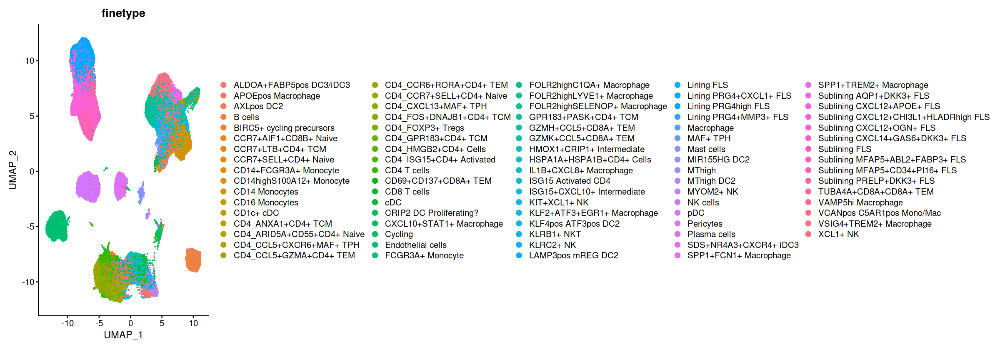

In [99]:
options(repr.plot.width=20, repr.plot.height=7)
DimPlot(syno, group.by="finetype", raster=FALSE)

In [ ]:
saveRDS(syno, "./syno_with_finetype.rds")